In [1]:
from functions_MuonsNSAMP1 import *
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy.ma as ma
import pandas as pd 
import skimage as sk
import random

def gaussian(x, a, mean, sigma):
    return a * np.exp(-((x - mean)**2 / (2 * sigma**2)))

def Gaussian2(x,m1,s1,g1,a1, m2, s2, g2, a2): #data, mean, sigma, gain, height1, heigth2
    return a1*np.exp(-1/2*((x-m1-g1)/s1)**2) + a2*np.exp(-1/2*((x-m2-g2)/s2)**2)

def Landau(x,a, MP,xi):
    C1 = a/np.sqrt((2 * np.pi))
    C2 = np.exp(-((x-MP)-1)/xi)
    C3 = np.exp((-0.5 * (((x-MP)-1)/xi + C2 )))

    # C1 = 1/np.sqrt((2 * np.pi))
    # C3 = np.exp((-0.5 * (x + np.exp(-x))))
    return  C1 * C3


def EnergySpectrum(x, N):
    return N * np.sin(x)*np.cos(x)**3

In [2]:
plt.rcParams.update({
    "image.origin": "lower",
    "image.aspect": 1,
    #"text.usetex": True,
    "grid.alpha": .5,
    "axes.linewidth":2,
    "lines.linewidth" : 1,
    "font.size":    15.0,
    "xaxis.labellocation": 'right',  # alignment of the xaxis label: {left, right, center}
    "yaxis.labellocation": 'top',  # alignment of the yaxis label: {bottom, top, center}
    "xtick.top":           True ,  # draw ticks on the top side
    "xtick.major.size":    8    ,# major tick size in points
    "xtick.minor.size":    4      ,# minor tick size in points
    "xtick.direction":     'in',
    "xtick.minor.visible": True,
    "ytick.right":           True ,  # draw ticks on the top side
    "ytick.major.size":    8    ,# major tick size in points
    "ytick.minor.size":    4      ,# minor tick size in points
    "ytick.direction":     'in',
    "ytick.minor.visible": True,
    "ytick.major.width":   2   , # major tick width in points
    "ytick.minor.width":   1 ,
    "xtick.major.width":   2   , # major tick width in points
    "xtick.minor.width":   1 ,
    "legend.framealpha": 0 ,
    "legend.loc": 'best',

})

# Raw Image

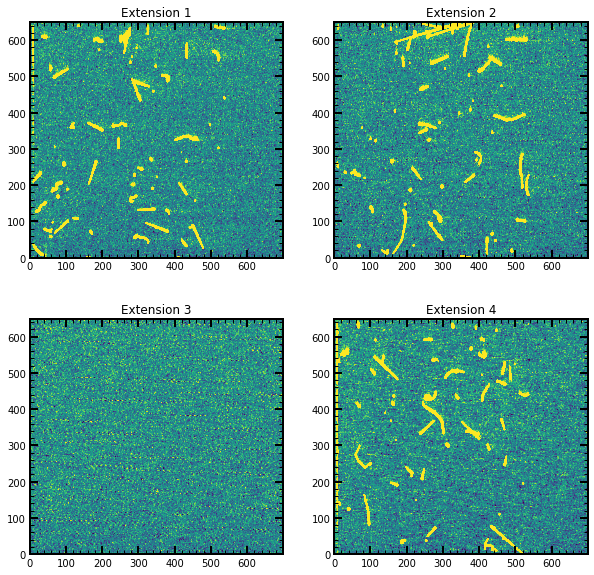

In [25]:
#path='/share/storage2/connie/data/microchip/proc_bkgd_1x2/proc_skp_moduleC002_bkgd_clearVB300_NBINROW2_img75.fits'
#path='/home/oem/datosFits/testMITLL/spuriousCharge/proc_skp_module24_MITLL01_externalVr-5_Vtest_T170_testLeakage_vtest_vdd-22__NSAMP324_NROW650_NCOL700_EXPOSURE0_NBINROW1_NBINCOL1_img1826.fits' #170
#path='/home/oem/datosFits/testMITLL/spuriousCharge/proc_skp_module24_MITLL01_externalVr-5_Vtest_T170_testLeakage_vtest_vdd-22__NSAMP324_NROW650_NCOL700_EXPOSURE0_NBINROW1_NBINCOL1_img1828.fits' #160
#path='/home/oem/datosFits/testMITLL/spuriousCharge/proc_skp_module24_MITLL01_externalVr-5_Vtest_T170_testLeakage_vtest_vdd-22__NSAMP324_NROW650_NCOL700_EXPOSURE0_NBINROW1_NBINCOL1_img1830.fits' #160
#path='/home/oem/datosFits/testMITLL/spuriousCharge/proc_skp_module24_MITLL01_externalVr-5_Vtest_T170_testLeakage_vtest_vdd-22__NSAMP324_NROW650_NCOL700_EXPOSURE0_NBINROW1_NBINCOL1_img1832.fits' #150
#path='/home/oem/datosFits/testMITLL/spuriousCharge/proc_skp_module24_MITLL01_externalVr-5_Vtest_T170_testLeakage_vtest_vdd-22__NSAMP324_NROW650_NCOL700_EXPOSURE0_NBINROW1_NBINCOL1_img1834.fits' #150
#path='/home/oem/datosFits/testMITLL/spuriousCharge/proc_skp_module24_MITLL01_externalVr-5_Vtest_T170_testLeakage_vtest_vdd-22__NSAMP324_NROW650_NCOL700_EXPOSURE0_NBINROW1_NBINCOL1_img1836.fits' #140
#path='/home/oem/datosFits/testMITLL/spuriousCharge/proc_skp_module24_MITLL01_externalVr-5_Vtest_T170_testLeakage_vtest_vdd-22__NSAMP324_NROW650_NCOL700_EXPOSURE0_NBINROW1_NBINCOL1_img1838.fits' #140
# path='/home/oem/datosFits/11FEB2023/proc_skp_module24_MITLL01_externalVr_Vv2_T140__NSAMP324_NROW650_NCOL700_EXPOSURE0_NBINROW1_NBINCOL1_img52.fits'
# path='/home/oem/datosFits/MicrochipTest_Marzo/datos/29MAR23/proc_skp_m-009_microchip_V_v2_T_170__seq__NSAMP_324_NROW_650_NCOL_700_EXPOSURE_0_NBINROW_1_NBINCOL_1_img_177.fits'


# path = '/home/labdet/Documents/MauSan/imagenesMicrochip/14JUN23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_700_NCOL_700_EXPOSURE_10_NBINROW_1_NBINCOL_1_img_1.fits'
# path = '/home/labdet/Documents/MauSan/imagenesMicrochip/16JUN23/proc_skp_m-009_microchip_vTested_T_170__seq_HA_NSAMP_4_NROW_1300_NCOL_1200_EXPOSURE_0_NBINROW_1_NBINCOL_1_img_02.fits'
path = '/home/labdet/Documents/MauSan/imagenesMicrochip/14JUN23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_700_NCOL_700_EXPOSURE_1200_NBINROW_1_NBINCOL_1_img_7.fits'
# path = '/home/labdet/Documents/MauSan/imagenesMicrochip/01AGO23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_700_NCOL_540_EXPOSURE_300_NBINROW_1_NBINCOL_1_img_130.fits'
# path = '/home/labdet/Documents/MauSan/imagenesMicrochip/01AGO23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_700_NCOL_700_EXPOSURE_300_NBINROW_1_NBINCOL_1_img_171.fits'
# path = '/home/labdet/Documents/MauSan/imagenesMicrochip/01AGO23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_700_NCOL_700_EXPOSURE_360_NBINROW_1_NBINCOL_1_img_244.fits'
# path = '/home/labdet/Documents/MauSan/imagenesMicrochip/01AGO23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_700_NCOL_700_EXPOSURE_360_NBINROW_1_NBINCOL_1_img_245.fits'
# path = '/home/labdet/Documents/MauSan/imagenesMicrochip/01AGO23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_650_NCOL_700_EXPOSURE_1200_NBINROW_1_NBINCOL_1_img_83.fits'

path = '/home/labdet/Documents/MauSan/imagenesMicrochip/01AGO23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_650_NCOL_700_EXPOSURE_1200_NBINROW_1_NBINCOL_1_img_1080.fits'

# path = '/home/labdet/Documents/MauSan/imagenesMicrochip/01AGO23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_650_NCOL_700_EXPOSURE_1200_NBINROW_1_NBINCOL_1_img_325.fits'
# path = '/home/labdet/Documents/MauSan/imagenesMicrochip/06OCT23/proc_skp_m-009_microchip_vtested_T_170__seq__NSAMP_324_NROW_650_NCOL_700_EXPOSURE_0_NBINROW_1_NBINCOL_1_img_1246.fits' 
# path = '/home/labdet/Documents/MauSan/imagenesMicrochip/12OCT23/proc_skp_m-009_microchip_vTested_T_170__seq_VA_NSAMP_225_NROW_650_NCOL_700_EXPOSURE_0_img_1250.fits'
# path = '/home/labdet/Documents/MauSan/imagenesMicrochip/17OCT23/am241/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_650_NCOL_700_EXPOSURE_0_NBINROW_1_NBINCOL_1_img_103.fits'
# path = '/home/labdet/Documents/MauSan/imagenesMicrochip/17OCT23/am241_gammas/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_650_NCOL_700_EXPOSURE_0_NBINROW_1_NBINCOL_1_img_10.fits'
# path = '/media/labdet/Expansion/Espectro_Energia_Muones/images_EXPOSURE_324/ENE2024/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_324_NROW_400_NCOL_700_EXPOSURE_0_NBINROW_1_NBINCOL_1_img_102.fits'


## DIRECCIONES DE COMPUTADORA DE CASA 
# path = '/home/bruce/Documents/imagenesMicrochip/14JUN23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_700_NCOL_700_EXPOSURE_420_NBINROW_1_NBINCOL_1_img_5.fits'
# path =  '/home/bruce/Documents/imagenesMicrochip/14JUN23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_700_NCOL_700_EXPOSURE_1200_NBINROW_1_NBINCOL_1_img_7.fits'
# path = '/home/bruce/Documents/imagenesMicrochip/14JUN23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_700_NCOL_700_EXPOSURE_10800_NBINROW_1_NBINCOL_1_img_8.fits'
# path = '/home/bruce/Documents/imagenesMicrochip/EspectroMuones/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_700_NCOL_700_EXPOSURE_900_NBINROW_1_NBINCOL_1_img_659.fits'

hdu_list = fits.open(path)
# print(hdu_list.info())
# print('----------------')
# hdu_list[0].header
plt.figure(figsize=(10,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(hdu_list[i].data-np.median(hdu_list[i].data),vmin=-900,vmax=900, cmap='viridis')
    plt.title('Extension '+str(i+1))
    # plt.ylabel('Y_px')
    # plt.xlabel('X_px')
plt.show()

In [68]:
hdu_list[0].header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                  -32 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                  700 / length of data axis 1                          
NAXIS2  =                  650 / length of data axis 2                          
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
CCDNCOL = '1058    '           / Smart sequencer variable                       
CCDNPRES= '7       '           / Smart sequencer variable                       
CCDNROW = '1278    '           / Smart sequencer variable                       
HIERARCH CLEARNCOL = '4000    ' / Smart sequencer variable                      
EXPOSURE= '1200    '        

In [28]:
hdu_path = path.split('_')
# int(hdu_path[15])

# Prueba de la suma de carga de un evento ficticio

1
[[-- -- -- -- --]
 [-- 10 10 10 --]
 [-- 10 40 10 --]
 [-- 10 10 10 --]
 [-- -- -- -- --]]
120


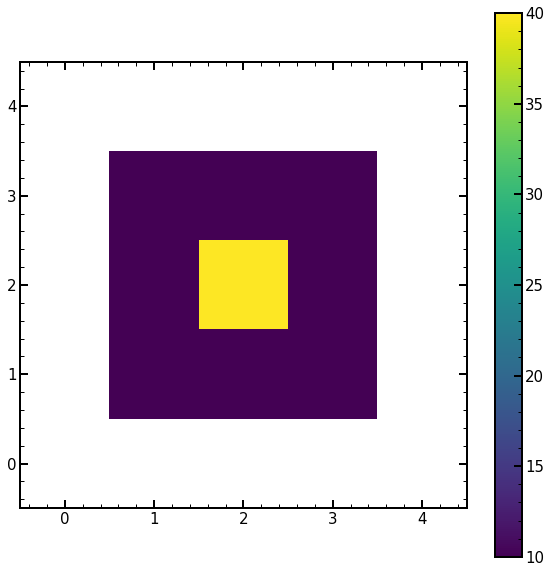

In [5]:
ficticio = np.array([[2,2,2,2,2,2,2,2,2,2,2], [2,2,2,2,2,2,2,2,2,2,2],[2,2,2,2,10,10,10,2,2,2,2],[2,2,2,2,10,40,10,2,2,2,2],[2,2,2,2,10,10,10,2,2,2,2], [2,2,2,2,2,2,2,2,2,2,2], [2,2,2,2,2,2,2,2,2,2,2]])
labelfic, n_eventsfic = ndimage.label(ficticio>2,structure=[[1,1,1],[1,1,1],[1,1,1]])
print(n_eventsfic)
# plt.figure(figsize=(10,10))
# plt.imshow(labelfic==0, cmap='gray', vmax=1,vmin=0)
locfic = ndimage.find_objects(labelfic==1)[0]
extra = 1
# print(locfic[0].start)
# print(locfic[1].stop)
# print(locfic)

# plt.imshow(ficticio[locfic[0].start-extra:locfic[0].stop+extra, locfic[1].start-extra:locfic[1].stop+extra], cmap='viridis')
mask_fict = np.invert(labelfic==1)
# print(mask_fict)

plt.figure(figsize=(10,10))
ficticio_mask = ma.masked_array(ficticio[locfic[0].start-extra:locfic[0].stop+extra, locfic[1].start-extra:locfic[1].stop+extra], mask_fict[locfic[0].start-extra:locfic[0].stop+extra, locfic[1].start-extra:locfic[1].stop+extra])
print(ficticio_mask)
plt.imshow(ficticio_mask, cmap='viridis')
plt.colorbar()

print(ficticio_mask.sum())

# Normalizando y calibrando los datos para obtener la sigmna 

Offset Value:  4065.78  ADUs
Centroide:  -98.13122214751351  Amplitud:  660.1714785763816 sigma:  875.4403219546749


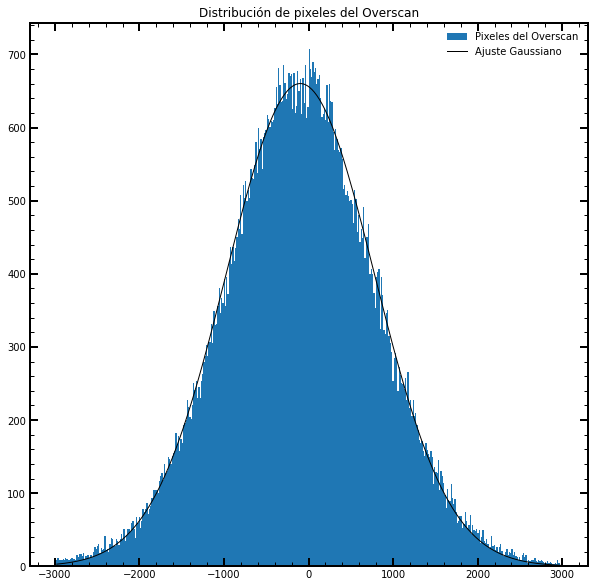

In [54]:
extension = 2
Bins = 400
ratio_keV = 0.0037

active_area = hdu_list[extension-1].data[:, :550]
header = hdu_list[0].header

# print(header)

Overscan = hdu_list[extension-1].data[:,550:]
expgain = [227, 220.4, 94.72, 197.7]

# print('Ganancia de cada extensión: ', expgain, ' en ADUs/e-')

# oScan_fit(extensión, active_area,  header, oScan, list_gain, Bins, make_figure_flag = False):
dict_popt_ADUs = oScan_fit_NSAMP1(extensión=extension, active_area=active_area, oScan=Overscan, Bins=Bins, make_figure_flag=True)

In [55]:
type(gauss(dict_popt_ADUs['Bins'][0], dict_popt_ADUs['Hight'], dict_popt_ADUs['Mean'], dict_popt_ADUs['sigma']))
np.size(gaussian(dict_popt_ADUs['Bins'][0], dict_popt_ADUs['Hight'], dict_popt_ADUs['Mean'], dict_popt_ADUs['sigma']))
# dict_popt_ADUs['Bins'][0]

398

In [56]:
dict_popt_ADUs

{'Mean': -98.13122214751351,
 'Hight': 660.1714785763816,
 'sigma': 875.4403219546749,
 'Offset': 4065.78,
 'Pcov': array([[3.75680138e+00, 2.76585467e-04, 3.32227393e+00],
        [2.76585467e-04, 8.80747950e+00, 8.07280065e-04],
        [3.32227393e+00, 8.07280065e-04, 8.81155432e+00]]),
 'Bins': [array([-2977.5, -2962.5, -2947.5, -2932.5, -2917.5, -2902.5, -2887.5,
         -2872.5, -2857.5, -2842.5, -2827.5, -2812.5, -2797.5, -2782.5,
         -2767.5, -2752.5, -2737.5, -2722.5, -2707.5, -2692.5, -2677.5,
         -2662.5, -2647.5, -2632.5, -2617.5, -2602.5, -2587.5, -2572.5,
         -2557.5, -2542.5, -2527.5, -2512.5, -2497.5, -2482.5, -2467.5,
         -2452.5, -2437.5, -2422.5, -2407.5, -2392.5, -2377.5, -2362.5,
         -2347.5, -2332.5, -2317.5, -2302.5, -2287.5, -2272.5, -2257.5,
         -2242.5, -2227.5, -2212.5, -2197.5, -2182.5, -2167.5, -2152.5,
         -2137.5, -2122.5, -2107.5, -2092.5, -2077.5, -2062.5, -2047.5,
         -2032.5, -2017.5, -2002.5, -1987.5, -1972.5,

In [57]:
### Cambiamos la sigma en ADUs a la e-

sig_ADUs = dict_popt_ADUs['sigma']
# Gain = popt[2]

sig_electrons = (sig_ADUs) / expgain[extension-1]
print('Sigma: ', sig_electrons, ' e-')

Sigma:  3.9720522774713016  e-


In [58]:
## Aplanamos el area activa y cambiamos las unidades a KeV
Offset = dict_popt_ADUs['Offset']
dataCal = data_calibrated(active_area=active_area, extension=extension, offset= Offset, list_gain=expgain, ratio_keV=ratio_keV, unidades=0)

# All Events DataFrame 

In [59]:
fondo_value = 4 * sig_ADUs
nsamp = float(header['NSAMP'])
Runid = str(header['RUNID'])

label_img, nlabels_img = sk.measure.label(dataCal > fondo_value, connectivity = 2, return_num = True)
prop = sk.measure.regionprops(label_img,dataCal)

TotalDataFrame = event_DataFrame(dataCal=dataCal, label_img=label_img, nlabels_img =nlabels_img, 
                                    prop=prop, header=header, extension=extension, unidades = 0)
TotalDataFrame

Events: 161


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (ADUs),Mean Charge (ADUs),Barycenter (px)
Event ID,,,,,,,
1,1080,2,11x2,17,3.905607e+05,22974.160156,"[5.8824, 0.3529]"
2,1080,2,27x7,123,1.970839e+07,160230.828125,"[11.2602, 2.3171]"
3,1080,2,6x49,200,1.838702e+07,91935.101562,"[1.915, 28.235]"
4,1080,2,19x13,88,1.461640e+07,166095.390625,"[9.7727, 5.4659]"
5,1080,2,38x124,467,3.284067e+07,70322.640625,"[27.6445, 72.152]"
...,...,...,...,...,...,...,...
157,1080,2,2x2,4,9.201988e+04,23004.968750,"[0.5, 0.5]"
158,1080,2,1x1,1,3.619220e+03,3619.219971,"[0.0, 0.0]"
159,1080,2,1x1,1,4.233220e+03,4233.220215,"[0.0, 0.0]"


In [60]:
# TotalDataFrame[50:70]

# Visualizar un evento en la imagen original, solo su "rebanada" y la "rebanada" enmascarada

Event Slice:
x: [357,379]
y: [554,642]


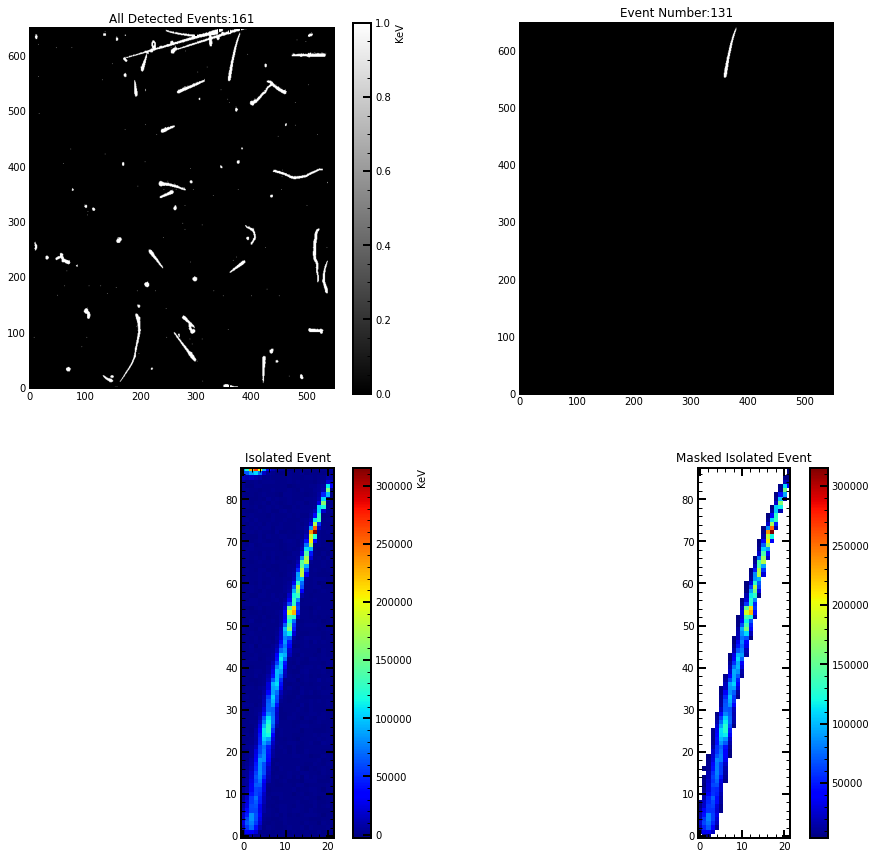

,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (ADUs),Mean Charge (ADUs),Barycenter (px)
Event ID,,,,,,,
131,1080,2,22x88,362,20035440.0,55346.519531,"[8.5414, 38.0414]"


In [66]:
n_label = 131
extra = 0
label, n_events =ndimage.label(dataCal> fondo_value,structure=[[1,1,1],[1,1,1],[1,1,1]]) # 48
# label, n_events = ndimage.label(dataCal>6*abs(popt[2]),structure=[[0,1,0],[1,1,1],[0,1,0]]) ## 50, 52

loc = ndimage.find_objects(label==n_label)[0]

fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(15,15))
# fig.suptitle('Event Number '+ str(n_label))
## Imagen original
axs[0,0].set_title('All Detected Events:'+str(n_events))
axs[0,0].imshow(label==0, cmap='gist_yarg', vmax = 1, vmin=0, origin='lower')
# plt.suptitle('Primer Imagen')

## Evento en la imagen original
axs[0,1].set_title('Event Number:'+str(n_label))
x0 = axs[0,1].imshow(label==n_label, cmap='gray', vmax=1,vmin=0, origin='lower')


axs[1,0].set_title('Isolated Event')
x1 = axs[1,0].imshow(dataCal[loc[0].start-extra:loc[0].stop+extra, loc[1].start-extra:loc[1].stop+extra], cmap='jet', origin = 'lower')
# plt.colorbar()

mask_35 = np.invert(label==n_label)
data_mask = ma.masked_array(dataCal[loc[0].start-extra:loc[0].stop+extra, loc[1].start-extra:loc[1].stop+extra], mask_35[loc[0].start-extra:loc[0].stop+extra, loc[1].start-extra:loc[1].stop+extra])
axs[1,1].set_title('Masked Isolated Event')
x2 = axs[1,1].imshow(data_mask, cmap='jet', origin='lower')
# axs[1,1].plot(totalFrame.iat[n_label-1, 7][0], totalFrame.iat[n_label-1, 7][1], 'ro') ## Plot the baricentrum
# print('n_label-1:', n_label-1)
# plt.legend('Baricentrum')

x0bar = fig.colorbar(x0, ax=axs[0,0])
x1bar = fig.colorbar(x1, ax=axs[1,0])
x2bar = fig.colorbar(x2, ax=axs[1,1])

x0bar.set_label('KeV')
x1bar.set_label('KeV')
# x2bar.set_label('KeV')
# fig.colorbar(axs[1,1], ax=[[x1,x2]], location = 'bottom', fraction = .1)

print('Event Slice:'  )
print('x: ['+str(loc[1].start)+','+str(loc[1].stop)+']')
print('y: ['+str(loc[0].start)+','+str(loc[0].stop)+']')
# print(loc)
# print(totalFrame.set_index('Event ID').iloc[[n_label-1]])
plt.show()

TotalDataFrame.iloc[[n_label-1]]

# Utilizando la libreria 'skimage.measure'

Centroide:  (1.0, 145.0)
Axis major length:  0.0
Axis minor length:  0.0
Elipcidad:  0
Box:  (1, 145, 2, 146)
Centroid Weighted:  (1.0, 145.0)
Label:  9
Orientation:  -0.7853981633974483
Slice:  (slice(1, 2, None), slice(145, 146, None))
Eccentricity:  0
Solidity:  1.0
Barycenter:  [0. 0.]


Centroide: ( 145.0 1.0  )
Orientation:  -0.7853981633974483
145.0 145.0 145.0
1.0 1.0 1.0
Event Charge:  3028.4  keV
Local Box:  [1, 1]  px
Local Box:  [15, 15] micras
Diagonal Lenght:  0.0  px
Diagonal Lenght:  0.0  micras
Delta_L:  725.0  px
Delta_L:  10875.0  micras
Delta EL:  4.177103313577586  keV/px
Delta EL:  0.2784735542385057  keV/micras
Delta EL:  41771.033135775855  keV/cm


(145.0, 146.0, 1.0, 2.0)

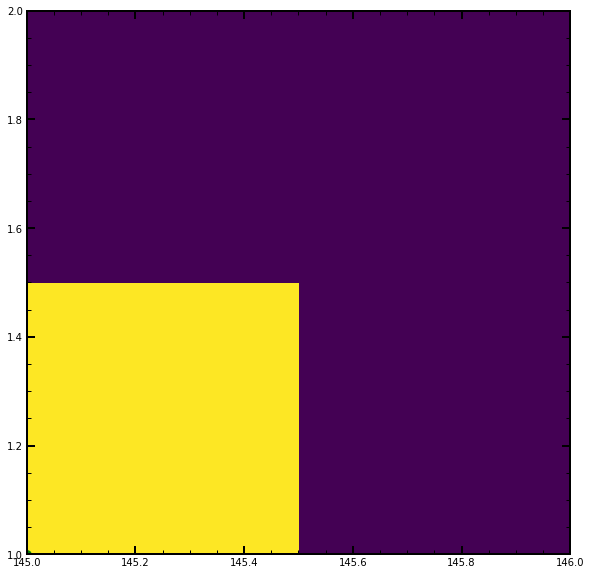

In [21]:
n_label= 9
CCD_depth = 725 ## micras
px_to_micras = 15 ## micras
px_to_cm = 0.0015 ## cm/px
micra_to_cm = 1 / 10000 ## micras/cm
fig, ax = plt.subplots(figsize=(10,10))

label_img, nlabels_img = sk.measure.label(dataCal > fondo_value, connectivity=2, return_num=True)
# print(nlabels_img)
ax.imshow(label_img==n_label) # Matriz centrada en el origen

prop = sk.measure.regionprops(label_img, dataCal)
# prop = sk.measure.regionprops(label_img)

# loc = ndimage.find_objects(label==n_label)[0]
loc = prop[n_label-1].slice

mask_35 = np.invert(label_img==n_label)
# ax.imshow(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])

data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])
charge = data_mask.sum()
# plt.imshow(dataCal[maxim.start:maxim.stop])
# ax.imshow(data_mask)

axis_mayor = prop[n_label-1].axis_major_length / 2
axis_minor = prop[n_label-1].axis_minor_length / 2

print("Centroide: ", prop[n_label-1].centroid)
print("Axis major length: ", axis_mayor)
print("Axis minor length: ", axis_minor)

try:    
    elipticity = (axis_mayor - axis_minor) / axis_mayor

except:
    elipticity = 0

print('Elipcidad: ', elipticity)

print("Box: ", prop[n_label-1].bbox)
# print("Centroide Local: ", prop[n_label-1].centroid_local)
print('Centroid Weighted: ', prop[n_label-1].centroid_weighted)
# print(prop[n_label-1].centroid_weighted_local)
# print(prop[n_label-1].coords_scaled)
# print(prop[n_label-1].coords)
# print(prop[n_label-1].extent)
# print(prop[n_label-1].image)
# print(prop[n_label-1].image_intensity)
print('Label: ', prop[n_label-1].label)
print('Orientation: ', prop[n_label-1].orientation)
print('Slice: ', prop[n_label-1].slice)
print('Eccentricity: ', prop[n_label-1].eccentricity)
print('Solidity: ', prop[n_label-1].solidity)
print('Barycenter: ', prop[n_label-1].centroid_local)
# print('Inertia tensor: ', prop[n_label-1].inertia_tensor)
# print('Intensity Max: ', prop[n_label-1].intensity_max)

print('\n')
## Ellipse 
y0, x0 = prop[n_label-1].centroid
print('Centroide: (', x0, y0, ' )' )
# y0, x0 = prop[n_label-1].centroid_weighted

orientation = prop[n_label-1].orientation
rotation = orientation * 1.92
print('Orientation: ', orientation)

x1 = x0 + math.cos(orientation) * 0.5 * prop[n_label-1].axis_minor_length
y1 = y0 - math.sin(orientation) * 0.5 * prop[n_label-1].axis_minor_length

x2 = x0 - math.sin(orientation) * 0.5 * prop[n_label-1].axis_major_length
y2 = y0 - math.cos(orientation) * 0.5 * prop[n_label-1].axis_major_length # Ellipse's major radio

x3 = x0 - math.sin(-orientation) * 0.5 * prop[n_label-1].axis_major_length
y3 = y0 + math.cos(orientation) * 0.5 * prop[n_label-1].axis_major_length # Ellipse's major radio


print(x1, x2, x3)
print(y1, y2, y3)

## Radio menor ##
ax.plot((x0, x1), (y0, y1), 'r', linewidth=1)
# ax.plot((x0, x2), (y0, y1), 'r', linewidth=1)

## Radio Mayor ##
ax.plot((x0, x3), (y0, y3), 'b', linewidth=1)
ax.plot((x0, x2), (y0, y2), 'b', linewidth=1)

ax.plot(x0, y0, '.g', markersize=15) # Ellipse's center
# ax.plot(prop[n_label-1].centroid_weighted[1], prop[n_label-1].centroid_weighted[0], '.g', markersize=15) # Ellipse's center charge

## Box and Delta_L
miny, minx, maxy, maxx = prop[n_label-1].bbox
Longitud_y = maxy - miny # px
Longitud_x = maxx - minx # px
Diagonal_lenght= np.sqrt(Longitud_x**2 + Longitud_y**2) - np.sqrt(2) # px
Delta_L = np.sqrt(Diagonal_lenght**2 + CCD_depth**2) # px
DeltaEL = charge / Delta_L # keV/px

print('Event Charge: ', charge, ' keV')
print("Local Box: ", [Longitud_x, Longitud_y], ' px' )
print("Local Box: ", [Longitud_x * px_to_micras, Longitud_y * px_to_micras], 'micras' )
print('Diagonal Lenght: ', Diagonal_lenght, ' px') ## px
print('Diagonal Lenght: ', Diagonal_lenght * px_to_micras, ' micras')
print('Delta_L: ', Delta_L, ' px')
print('Delta_L: ', Delta_L * px_to_micras, ' micras')
print('Delta EL: ', DeltaEL, ' keV/px')
print('Delta EL: ', DeltaEL / px_to_micras, ' keV/micras')
print('Delta EL: ', DeltaEL / micra_to_cm, ' keV/cm')
bx = (minx, maxx, maxx, minx, minx)
by = (miny, miny, maxy, maxy, miny)
# ax.plot(bx, by, '-b', linewidth=2.5)


# rect = mpl.mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr, fill=False, edgecolor='red', linewidth=2)
# ax.add_patch(rect)

# Draw Ellipse
# excent = prop[n_label-1].eccentricity
u= x0   #x-position of the center
v= y0    #y-position of the center
b = prop[n_label-1].axis_major_length/2    #radius on the x-axis
a = prop[n_label-1].axis_minor_length/2   #radius on the y-axis


cy, cx = sk.draw.ellipse_perimeter(int(v), int(u), int(a), int(b), orientation)
# ax.plot(cx, cy, 'k.')


# t = np.linspace(0, 2 * np.pi, 100)
# origianl_x, original_y = u + a * np.cos(t) , v + b * np.sin(t)
# rotate_x, rotate_y = u - 1 * a * np.cos(t) * np.cos(rotation) - b * np.sin(t) * np.sin(rotation), v + b * np.sin(t) * np.cos(rotation) + a * np.cos(t) * np.sin(rotation)


# # el = Ellipse((x0, y0), hradius = a, vradius = b)
# img = np.zeros((700, 700), dtype=float)
# ellip0, ellip1 = sk.draw.ellipse_perimeter(int(x0), int(y0), int(a), int(b), int(orientation))
# img[ellip0, ellip1] = 1
# plt.plot(img, 'ro')


# print('Tipo: ', type(a), float(a))
# plt.plot(rotate_x,rotate_y, 'k')
# # plt.plot(origianl_x,original_y, 'b')
# # plt.plot(el)

ext=0
ax.axis((loc[1].start-ext, loc[1].stop+ext, loc[0].start-ext, loc[0].stop+ext))
# ax.imshow(data_mask)
# ax.can_zoom()


In [14]:
minr, minc, maxr, maxc = prop[41].bbox

maxr - minr

maxc - minc

1

## Filtro de Muones

In [63]:
## Calcula cuantos muones tiene la extensión comparando la relación del radio mayor de la elipse con el radio menor
DeltaL, DeltaEL, list_charge, lebel_muons, list_theta, _ = muon_filter(dataCal=dataCal, label_img=label_img, 
                                                                    nlabels_img=nlabels_img, prop=prop, 
                                                                    Solidit=0.6, Elipticity=0.6)
                                                                    
print('All Clusters: ', nlabels_img)
print('Muons Detected: ', len(lebel_muons))
print(lebel_muons)


DF_straightevents = pd.DataFrame(lebel_muons, columns=['Event ID'] )
DF_dl = pd.DataFrame(DeltaL, columns=['Delta L (cm)'])
DF_charge = pd.DataFrame(list_charge, columns=['Charge (e-)'])
DF_dedl = pd.DataFrame(DeltaEL, columns=['dE/dL (e-/cm)'])
DF_angle = pd.DataFrame(list_theta, columns=['Theta (°)'])
DF_dEdL = pd.concat([DF_straightevents, DF_dl, DF_charge,  DF_dedl, DF_angle], axis=1)
DF_dEdL.set_index('Event ID')


All Clusters:  161
Muons Detected:  14
[2, 3, 4, 13, 26, 27, 52, 54, 79, 83, 125, 127, 131, 141]


,Delta L (cm),Charge (e-),dE/dL (e-/cm),Theta (°)
Event ID,,,,
2,0.082666,19708392.0,2.384086e+08,28.715239
3,0.102127,18387018.0,1.800415e+08,44.772945
4,0.079415,14616395.0,1.840508e+08,24.087128
13,0.122216,31411708.0,2.570174e+08,53.614818
26,0.093527,33174252.0,3.547019e+08,39.178988
27,0.083323,8475424.0,1.017174e+08,29.529142
52,0.090043,12902528.0,1.432934e+08,36.373027
54,0.095448,14737430.0,1.544024e+08,40.573322
79,0.083593,11898309.0,1.423370e+08,29.853338


In [16]:
## DataFrame de los muones
for n_label in lebel_muons:
    # print(n_label)
    DataFrame_Event = TotalDataFrame.iloc[[n_label-1]]
    display(DataFrame_Event)

# for n_label in range(0, len(totalFrame['Event ID'])):
#     totalFrame.set_index('Event ID').iloc[[n_label-1]]

,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
1,7,2,14x4,46,3633063.5,78979.625,"[6.913, 1.3478]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
2,7,2,20x16,115,6579155.0,57210.042969,"[10.5826, 7.2522]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
48,7,2,15x14,89,14824246.0,166564.578125,"[7.4719, 6.9213]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
62,7,2,47x21,234,16438966.0,70252.0,"[20.2607, 9.7863]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
72,7,2,8x17,59,6350249.0,107631.335938,"[3.5085, 9.2712]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
76,7,2,24x61,262,19770866.0,75461.328125,"[10.5534, 25.7252]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
110,7,2,42x10,229,16101762.0,70313.382812,"[22.0349, 4.2052]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
120,7,2,21x15,123,11295766.0,91835.492188,"[9.4065, 6.2033]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
129,7,2,8x20,92,13516734.0,146921.015625,"[3.087, 9.8696]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
133,7,2,7x20,94,12495445.0,132930.25,"[2.3404, 8.3404]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
138,7,2,31x9,177,14192105.0,80181.375,"[13.4407, 3.5254]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
143,7,2,16x57,250,25439528.0,101758.109375,"[7.464, 24.384]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
146,7,2,19x30,226,30799720.0,136281.953125,"[8.146, 15.3186]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
152,7,2,19x12,114,11616990.0,101903.429688,"[8.5351, 5.2807]"


,Image ID,Extension,Matrix Size (px),Event Size (px),Total Charge (e-),Mean Charge (e-),Barycenter (px)
Event ID,,,,,,,
154,7,2,50x7,213,10476640.0,49186.109375,"[26.0704, 2.5962]"


In [17]:
## Calcula el dE/dL de otros eventos
event_label = 23
label_img, nlabels_img = sk.measure.label(dataCal > fondo_value, connectivity=2, return_num=True)
prop = sk.measure.regionprops(label_img,dataCal)
list_event = []
list_dedl = []
list_diagonal_lenght = []
list_dl = []
list_charge = []
list_angle = []
mask = np.invert(label_img == event_label)
loc = ndimage.find_objects(label_img == event_label)[0]

data_maskEvent = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop],
                                        mask[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])

charge = data_maskEvent.sum() # KeV
miny, minx, maxy, maxx = prop[event_label-1].bbox
Longitud_y = maxy - miny # px
Longitud_x = maxx - minx # px
Diagonal_lenght= np.sqrt(Longitud_x**2 + Longitud_y**2) - np.sqrt(2) # px
Delta_L = np.sqrt( (Diagonal_lenght * px_to_micras)**2 + (CCD_depth)**2) * micra_to_cm # cm
DeltaEL_KeV= charge / (Delta_L) # keV/cm
DeltaEL_MeV=  DeltaEL_KeV/1000 # MeV/cm
theta = np.arctan((Diagonal_lenght * px_to_cm)/(CCD_depth * micra_to_cm)) *(180 /np.pi)

list_event.append(event_label)
list_diagonal_lenght.append(Diagonal_lenght * px_to_cm)
list_dl.append(Delta_L)
list_charge.append(charge / 1000)
list_dedl.append(DeltaEL_MeV)
list_angle.append(theta)
# print(lebel_muons[index_event], str(DeltaEL_GeV) + ' GeV/cm')
# print( Straight_Events[index_event], Delta_L, DeltaEL_MeV, charge, theta)

DF_straightevents = pd.DataFrame(list_event, columns=['Event ID'] )
DF_diagonal_lenght = pd.DataFrame(list_diagonal_lenght, columns=['Diagonal XY (cm)'])
DF_dl = pd.DataFrame(list_dl, columns=['Delta L (cm)'])
DF_charge = pd.DataFrame(list_charge, columns=['Charge (MeV)'])
DF_dedl = pd.DataFrame(list_dedl, columns=['dE/dL (MeV/cm)'])
DF_angle = pd.DataFrame(list_angle, columns=['Angle (°)'])
DF_dEdL = pd.concat([DF_straightevents, DF_diagonal_lenght, DF_dl, DF_charge,  DF_dedl, DF_angle], axis=1)
DF_dEdL.set_index('Event ID')

,Diagonal XY (cm),Delta L (cm),Charge (MeV),dE/dL (MeV/cm),Angle (°)
Event ID,,,,,
23,0.0,0.0725,4.92911,67.987729,0.0


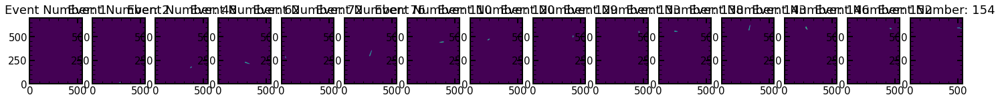

In [18]:
## Visualizar eventos rectos en una sola fila

fig, axs = plt.subplots(ncols = len(lebel_muons), nrows=1, figsize=(25,25))
for index_event in range(0,len(lebel_muons)):
    loc = prop[lebel_muons[index_event]].slice
    mask_35 = np.invert(label_img==n_label)
    data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])
    # plt.imshow(dataCal[maxim.start:maxim.stop])
    # ax.imshow(data_mask)

    axs[index_event].imshow(label_img == lebel_muons[index_event])
    axs[index_event].set_title('Event Number: '+ str(lebel_muons[index_event]))
    # axs[0, index_event].axis((loc[1].start-ext, loc[1].stop+ext, loc[0].start-ext, loc[0].stop+ext))


# plt.imshow(label_img==lebel_muons[10])

# fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(15,15))
# round(len(lebel_muons)/2, 0)

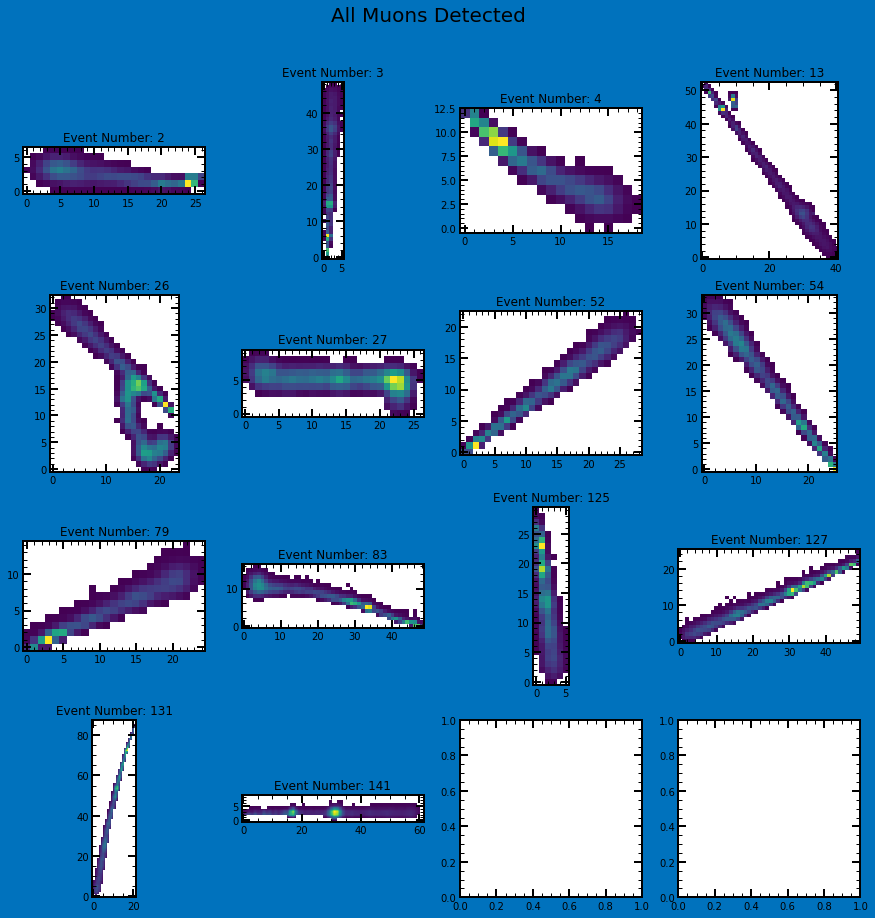

In [65]:
## Visualizar en una matriz los eventos rectos detectados 
coord2x2 = [[0,0],[0,1], [1,0], [1,1]]

coord3x3 = [[0,0],[0,1], [0,2], [1,0], [1,1], [1,2], [2,0], [2,1], [2,2]]

coord4x4 = [[0,0],[0,1], [0,2], [0,3], [1,0], [1,1], [1,2], [1,3], [2,0], [2,1], [2,2], [2,3], [3,0], [3,1], [3,2], [3,3]]

coords5x5 = [[0,0],[0,1], [0,2], [0,3], [0,4], [1,0], [1,1], [1,2], [1,3], [1,4], [2,0], [2,1], [2,2], [2,3], [2,4], [3,0], [3,1], [3,2], [3,3], [3,4],[4,0], [4,1], [4,2], [4,3], [4,4]]

if len(lebel_muons) < 5:
    fig, axs = plt.subplots(ncols = 2, nrows = 2, figsize=(15,15), facecolor = [0, 0.4470, 0.7410])
    fig.suptitle('All Muons Detected',  y = 0.95, size = 20)

    for index_event in range(0,len(lebel_muons)):
        loc = ndimage.find_objects(label_img == lebel_muons[index_event])[0]
        mask_35 = np.invert(label_img == lebel_muons[index_event])
        data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])
        # plt.imshow(dataCal[maxim.start:maxim.stop])
        # ax.imshow(data_mask)

        axs[coord2x2[index_event][0],coord2x2[index_event][1]].set_title('Event Number: '+ str(lebel_muons[index_event]))
        # axs[coord2x2[index_event][0],coord2x2[index_event][1]].imshow(label_img == Straight_Events[index_event]) ## All image
        # axs[coord2x2[index_event][0],coord2x2[index_event][1]].imshow(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop]) ## Event without mask
        axs[coord2x2[index_event][0],coord2x2[index_event][1]].imshow(data_mask) ## Event with mask
        # axs[coord2x2[index_event][0],coord2x2[index_event][1]].plot(TF.iat[Straight_Events[index_event]-1, 9][0], TF.iat[Straight_Events[index_event]-1, 9][1],  'ro')#[0], TF.iat[index_

elif len(lebel_muons) > 4 and len(lebel_muons) < 10:
    fig, axs = plt.subplots(ncols = 3, nrows = 3, figsize=(11,11), facecolor = [0, 0.4470, 0.7410])
    fig.suptitle('All Muons Detected',  y = 0.95, size = 20)

    for index_event in range(0,len(lebel_muons)):
        loc = ndimage.find_objects(label_img == lebel_muons[index_event])[0]
        mask_35 = np.invert(label_img == lebel_muons[index_event])
        data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])
        # plt.imshow(dataCal[maxim.start:maxim.stop])
        # ax.imshow(data_mask)

        axs[coord3x3[index_event][0],coord3x3[index_event][1]].set_title('Event Number: '+ str(lebel_muons[index_event]))
        # axs[coord3x3[index_event][0],coord3x3[index_event][1]].imshow(label_img == Straight_Events[index_event]) ## All image
        # axs[coord3x3[index_event][0],coord3x3[index_event][1]].imshow(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop]) ## Event without mask
        axs[coord3x3[index_event][0],coord3x3[index_event][1]].imshow(data_mask, cmap = 'jet') ## Event with mask
        # axs[coord3x3[index_event][0],coord3x3[index_event][1]].colorbar()
        # axs[coord3x3[index_event][0],coord3x3[index_event][1]].plot(TF.iat[Straight_Events[index_event]-1, 9][0], TF.iat[Straight_Events[index_event]-1, 9][1],  'ro')#[0], TF.iat[index_event, 7][1], 'ro') ## Plot the baricentrum

elif len(lebel_muons) > 9 and len(lebel_muons) < 17:
    fig, axs = plt.subplots(ncols = 4, nrows = 4, figsize=(15,15), facecolor = [0, 0.4470, 0.7410])
    fig.suptitle('All Muons Detected',  y = 0.95, size = 20)

    for index_event in range(0,len(lebel_muons)):
        loc = ndimage.find_objects(label_img == lebel_muons[index_event])[0]
        mask_35 = np.invert(label_img == lebel_muons[index_event])
        data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])

        # coordX_centerCharge = round(ndimage.center_of_mass(data_maskEvent)[1])
        # coordY_centerCharge = round(ndimage.center_of_mass(data_maskEvent)[0])
        # Barycentercharge = data_maskEvent[coordY_centerCharge, coordX_centerCharge]

        axs[coord4x4[index_event][0],coord4x4[index_event][1]].set_title('Event Number: '+ str(lebel_muons[index_event]))
        # axs[coord4x4[index_event][0],coord4x4[index_event][1]].imshow(label_img == Straight_Events[index_event]) ## All image
        # axs[coord4x4[index_event][0],coord4x4[index_event][1]].imshow(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop]) ## Event without mask
        axs[coord4x4[index_event][0],coord4x4[index_event][1]].imshow(data_mask, aspect = 1) ## Event with mask
        # axs[coord4x4[index_event][0],coord4x4[index_event][1]].plot(TF.iat[Straight_Events[index_event]-1, 9][0], TF.iat[Straight_Events[index_event]-1, 9][1],  'ro')#[0], TF.iat[index_
        # axs[coord4x4[index_event][0],coord4x4[index_event][1]].text(1,0,'dE/dx', transform = axs[coord4x4[index_event][0],coord4x4[index_event][1]].transAxes)

elif len(lebel_muons) > 16 and len(lebel_muons) <= 25:
    fig, axs = plt.subplots(ncols = 5, nrows = 5, figsize=(15,15), facecolor = [0, 0.4470, 0.7410])
    fig.suptitle('All Muons Detected',  y = 0.95, size = 20)

    for index_event in range(0,len(lebel_muons)):
        loc = ndimage.find_objects(label_img == lebel_muons[index_event])[0]
        mask_35 = np.invert(label_img == lebel_muons[index_event])
        data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])
        # plt.imshow(dataCal[maxim.start:maxim.stop])
        # ax.imshow(data_mask)        

        axs[coords5x5[index_event][0],coords5x5[index_event][1]].set_title('Event Number: '+ str(lebel_muons[index_event]))
        # axs[coords5x5[index_event][0],coords5x5[index_event][1]].imshow(label_img == lebel_muons[index_event])
        # axs[coords5x5[index_event][0],coords5x5[index_event][1]].imshow(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop]) ## Event without mask
        axs[coords5x5[index_event][0],coords5x5[index_event][1]].imshow(data_mask, aspect = 1) ## Event with mask

elif len(lebel_muons) > 25:
    print('Demasiados eventos para mostrar!!!')



In [20]:
print(len(extension_1[0]))
extension_1[0]

NameError: name 'extension_1' is not defined

# Perfil de Muones Rectos

In [45]:
## Calcula cuantos muones tiene la extensión comparando la relación del radio mayor de la elipse con el radio menor
Straight_Muons = []
DeltaEL_range_min, DeltaEL_range_max = 1, 4
prop = sk.measure.regionprops(label_img, dataCal)
Elipticity = 0.8

for event in range(1, nlabels_img):

    mask = np.invert(label_img == event)
    loc = ndimage.find_objects(label_img == event)[0]
    
    data_maskEvent = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop],
                                         mask[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])

    coordX_centerCharge = round(ndimage.center_of_mass(data_maskEvent)[1])
    coordY_centerCharge = round(ndimage.center_of_mass(data_maskEvent)[0])

    MinValue_Event = data_maskEvent.min()
    MeanValue_Event = data_maskEvent.mean()

    rM = prop[event-1].axis_major_length/2
    rm = prop[event-1].axis_minor_length/2
    Solidity = prop[event-1].solidity
    miny, minx, maxy, maxx = prop[event-1].bbox
    Longitud_y, Longitud_x = maxy - miny , maxx - minx # px

    Barycentercharge = data_maskEvent[coordY_centerCharge, coordX_centerCharge]
    
    try:
        differval = abs(Barycentercharge - MinValue_Event) 
    except:
        differval = 0 
        

    try:
        elip = (rM - rm)/rM

    except:
        elip = 0

    if rM == 0 or rm == 0:
        continue 

    elif maxx - minx <= 3:
        continue

    elif not Barycentercharge:
        continue

    elif differval < MeanValue_Event: 
        continue

    elif  Solidity < 0.7:
        continue 

    elif  elip >= Elipticity:
        if Longitud_x < 7 and Longitud_y > 10: 
            # print(elip)
            Straight_Muons.append(event)

        if Longitud_y < 7 and Longitud_x > 10: 
            # print(elip)
            Straight_Muons.append(event)


print('Straight Events Detected: ', len(Straight_Muons))
print(Straight_Muons)

Straight Events Detected:  3
[172, 368, 421]


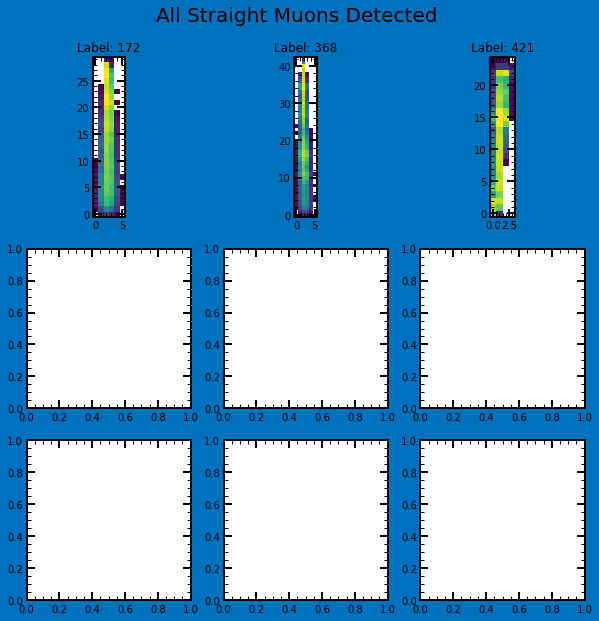

In [41]:
# Visualiza los muones verticales/horizontales detectados

coord2x2 = [[0,0],[0,1], [1,0], [1,1]]
coord3x3 = [[0,0],[0,1], [0,2], [1,0], [1,1], [1,2], [2,0], [2,1], [2,2]]
coord4x4 = [[0,0],[0,1], [0,2], [0,3], [1,0], [1,1], [1,2], [1,3], [2,0], [2,1], [2,2], [2,3], [3,0], [3,1], [3,2], [3,3]]
coords5x5 = [[0,0],[0,1], [0,2], [0,3], [0,4], [1,0], [1,1], [1,2], [1,3], [1,4], [2,0], [2,1], [2,2], [2,3], [2,4], [3,0], [3,1], [3,2], [3,3], [3,4],[4,0], [4,1], [4,2], [4,3], [4,4]]


fig, axs = plt.subplots(ncols = 3, nrows = 3, figsize=(10,10), facecolor = [0, 0.4470, 0.7410])
fig.suptitle('All Straight Muons Detected',  y = 0.95, size = 20)

for index_event in range(0,len(Straight_Muons)):
    loc = ndimage.find_objects(label_img == Straight_Muons[index_event])[0]
    mask_35 = np.invert(label_img == Straight_Muons[index_event])
    data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])
    # plt.imshow(dataCal[maxim.start:maxim.stop])
    # ax.imshow(data_mask)

    axs[coord3x3[index_event][0],coord3x3[index_event][1]].set_title('Label: '+ str(Straight_Muons[index_event]))
    # axs[coord2x2[index_event][0],coord2x2[index_event][1]].imshow(label_img == Straight_Events[index_event]) ## All image
    # axs[coord2x2[index_event][0],coord2x2[index_event][1]].imshow(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop]) ## Event without mask
    axs[coord3x3[index_event][0],coord3x3[index_event][1]].imshow(data_mask) ## Event with mask
    # axs[coord2x2[index_event][0],coord2x2[index_event][1]].plot(TF.iat[Straight_Events[index_event]-1, 9][0], TF.iat[Straight_Events[index_event]-1, 9][1],  'ro')#[0], TF.iat[index_


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


63382.04 229105.03


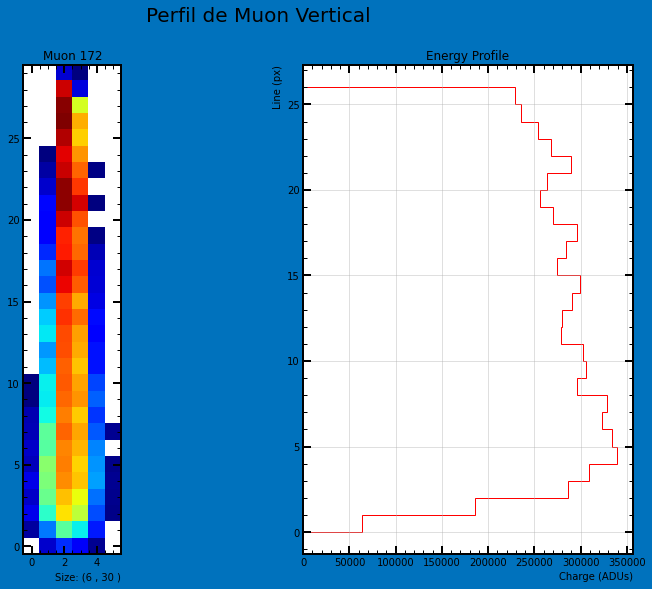

In [51]:
## Muons Extention 4
# muons_vertical_labels_1 = [[73], [3], [6], [14], [27]] #, 23,  27, 40, 43, 46, 49, 59, 85, 92, 94, 98] # Extensión 4

muon_label = 172  # Se coloca directamente el label del evento

Delta_inicial = 1
Delta_final = 3
extension = 4

fig, axs = plt.subplots(ncols=2, nrows=1, figsize = [13,9], facecolor = [0, 0.4470, 0.7410])
fig.suptitle('Perfil de Muon Vertical', y = 0.97, size = 20)

# for event in matrix_ext_4_vertical[num:num + 1]:

# event = check_flip_vertical_muon(dict= data_histogram, label_muon=muon_label, Delta_in=Delta_inicial, Delta_fin=Delta_final, extension=extension)
loc = ndimage.find_objects(label==muon_label)[0]
mask_35 = np.invert(label==n_label)
data_mask = ma.masked_array(dataCal[loc[0].start-extra:loc[0].stop+extra, loc[1].start-extra:loc[1].stop+extra], mask_35[loc[0].start-extra:loc[0].stop+extra, loc[1].start-extra:loc[1].stop+extra])


event = data_mask
# plt.imshow(event)
size_x = event.shape[1] # tamaño en x
size_y = event.shape[0] # tamaño en y
# print(event.sum())

label_verticalMuon, nlabels_verticalMuon = ndimage.label(event,structure=[[0,0,0],[1,1,1],[0,0,0]])

charge_verticalMuon = []
for lable_line in np.arange(Delta_inicial, nlabels_verticalMuon - Delta_final):
    line = label_verticalMuon == lable_line
    loc = ndimage.find_objects(label_verticalMuon == lable_line)[0]
    mask_35 = np.invert(label_verticalMuon == lable_line)
    data_mask = ma.masked_array(event[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])
    # print(len(data_mask[0]))
    charge = data_mask.sum()
    # print(charge)
    mean_charge = data_mask.mean()

    charge_verticalMuon.append(charge)
    # print(charge)

## Linea inferior ##
# line_inf = [size_x]
# axs[0].imshow(data_mask)
print(charge_verticalMuon[0], charge_verticalMuon[-1])
        
# cmap = 'plasma'
axs[0].imshow(event, cmap = 'jet')#, origin='upper')
axs[0].set_title('Muon ' + str(muon_label))
axs[0].set_xlabel('Size: (' + str(size_x) + ' , ' + str(size_y) + ' )')
# x0bar = fig.colorbar(x0, ax=axs[0])

axs[1].stairs(charge_verticalMuon, np.arange(0,len(charge_verticalMuon)+1),  orientation='horizontal', color = 'r')#,  hatch = '////')
# axs[1].vlines(x = mean_charge, ymin = 0, ymax = len(event) - 1, color = 'k', label = 'Mean Charge \n' + str(mean_charge))
axs[1].set_xlabel('Charge (ADUs)')
axs[1].set_ylabel('Line (px)')
# axs[1].set_ylim(0,len(event) - 1 )
axs[1].set_title('Energy Profile')
axs[1].legend()
axs[1].grid()
plt.show()

## Filtro de Eventos de Fluorescencia del Cu y Si

In [ ]:
## Calcula cuantos eventos circulares tiene la extensión comparando la relación del radio mayor de la elipse con el radio menor
Fluorescence_Events = []

for event in range(1, nlabels_img):
    mask = np.invert(label_img == event)
    loc = ndimage.find_objects(label_img == event)[0]
    
    data_maskEvent = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop],
                                         mask[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])

    coordX_centerCharge = round(ndimage.center_of_mass(data_maskEvent)[1])
    coordY_centerCharge = round(ndimage.center_of_mass(data_maskEvent)[0])

    # MaxValue_Event = data_maskEvent.max()
    MinValue_Event = data_maskEvent.min()
    MeanValue_Event = data_maskEvent.mean()
    # MeanValue_Event = (MaxValue_Event - MinValue_Event)/2
    Barycentercharge = data_maskEvent[coordY_centerCharge, coordX_centerCharge]
    try:
        differval = abs(Barycentercharge - MinValue_Event) 
    except:
        differval = 0 

    rM = prop[event-1].axis_major_length
    rm = prop[event-1].axis_minor_length
    # Solidity = prop[event-1].solidity
    charge = data_maskEvent.sum()
    miny, minx, maxy, maxx = prop[event-1].bbox
    Long_y = maxy - miny
    Long_x = maxx - minx 
    # if Long_x > 5 or Long_y > 5:
    #     continue

    # if differval < MeanValue_Event:
    #     continue

    if  rM <= 2 * rm:
        # print(Barycentercharge, differval)
        Fluorescence_Events.append(event)

print('Straight Events Detected: ', len(Fluorescence_Events))
print(Fluorescence_Events)
# print(type(data_maskEvent))

Straight Events Detected:  944
[1, 2, 4, 6, 7, 10, 11, 12, 13, 15, 16, 18, 19, 20, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 42, 43, 45, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 107, 108, 109, 110, 111, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 130, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 234, 235, 236, 23

In [ ]:
muestra_Fluorescence_Events = random.sample(Fluorescence_Events, 25)
print(muestra_Fluorescence_Events)

[15, 94, 54, 76, 78, 9, 31, 83, 46, 96, 10, 41, 97, 21, 73, 77, 60, 88, 71, 47, 103, 43, 52, 67, 79]


In [ ]:
charge_Fluorescence_Events = []
for index_event in range(0,len(Fluorescence_Events)):
    mask = np.invert(label_img == Fluorescence_Events[index_event])
    loc = ndimage.find_objects(label_img == Fluorescence_Events[index_event])[0]
    
    data_maskEvent = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop],
                                         mask[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])

    charge = data_maskEvent.sum() # KeV
    print(charge)
    charge_Fluorescence_Events.append(charge)
    # miny, minx, maxy, maxx = prop[Fluorescence_Events[index_event]-1].bbox
    # Longitud_y = maxy - miny # px
    # Longitud_x = maxx - minx # px
    # Diagonal_lenght= np.sqrt(Longitud_x**2 + Longitud_y**2) - np.sqrt(2) # px
    # Delta_L = np.sqrt( (Diagonal_lenght * px_to_micras)**2 + (CCD_depth)**2) * micra_to_cm # cm
    # DeltaEL_KeV= charge / (Delta_L) # keV/cm
    # DeltaEL_MeV=  DeltaEL_KeV/1000 # MeV/cm
    # theta = np.arctan((Diagonal_lenght * px_to_cm)/(CCD_depth * micra_to_cm)) *(180 /np.pi)

    # list_diagonal_lenght.append(Diagonal_lenght * px_to_cm)
    # list_dl.append(Delta_L)
    # list_charge.append(charge / 1000)
    # list_dedl.append(DeltaEL_MeV)
    # list_angle.append(theta)
    # print(Straight_Events[index_event], str(DeltaEL_GeV) + ' GeV/cm')
    # print( Straight_Events[index_event], Delta_L, DeltaEL_MeV, charge, theta)


29.396383
11.251631
12.180907
15.016613
12.646769
16.334347
53.483353
15.201327
0.2204893
17.147121
12.92529
12.365841
0.23425518
0.22263812
12.127844
217.41286
0.22989038
0.2378981
0.23527923
20.059021
0.21985136
0.22638176
0.22393076
0.2399462
0.2266
0.23308003
0.23121661
0.22142941
0.23880464
0.23227423
0.22856416
0.24192713
12.984165
0.25196615
0.22488765
0.22112723
0.22109364
0.22030464
0.24446207
0.24323659
0.21864265
0.2188441
0.23319755
0.21892804
0.22545844
0.21867622
0.22532414
0.22720437
0.22310817
19.037325
0.22221842
0.22092578
0.21968348
0.22211769
0.23642078
0.22379647
0.24355553
0.22288993
0.22211769
0.25116035
0.22299066
0.2361186
0.23442306
0.2860787
0.23893894
0.22011997
0.21919665
0.22230238
0.2312502
0.23935862
0.22168122
0.224703
0.22503877
0.22349429
0.2806395
0.21928059
0.22727151
0.23767985
77.49448
0.22142941
0.22146298
0.23155238
0.22764084
0.22493802
0.22106008
0.21889447
0.22680147
0.25050563
0.22235273
0.22503877
0.2225374
0.21896163
186.65971
0.24118848
0

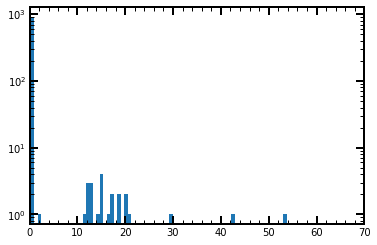

In [ ]:
plt.hist(charge_Fluorescence_Events, bins=300)
plt.yscale('log')
plt.xlim(0,70)
plt.show()

In [ ]:
## DataFrame de los eventos circulares
for n_label in Straight_Events:
    # print(n_label)
    display(totalFrame.set_index('Event ID').iloc[[n_label-1]])

NameError: name 'Straight_Events' is not defined

In [ ]:
label_img, nlabels_img = sk.measure.label(dataCal>6*popt[2], connectivity=2, return_num=True)
# print(nlabels_img)
prop = sk.measure.regionprops(label_img,dataCal)

for n_label in Straight_Events:
    print(n_label, prop[n_label-1].solidity)

NameError: name 'Straight_Events' is not defined

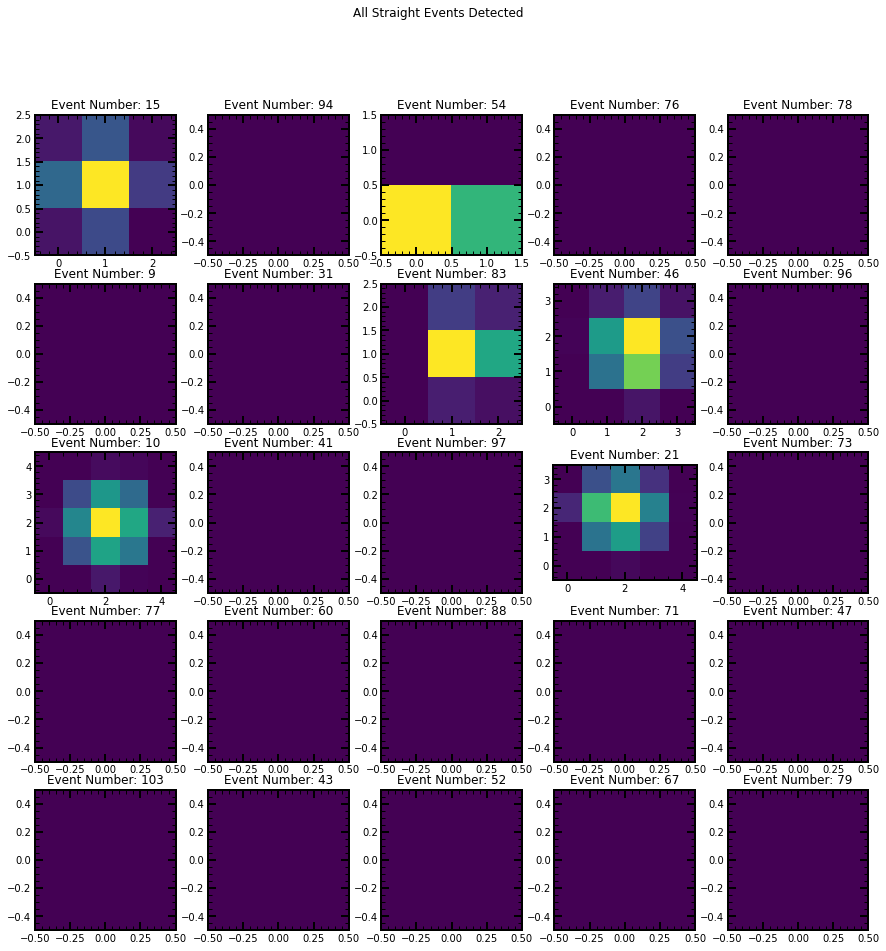

In [ ]:
## Visualizar en una matriz los eventos rectos detectados 
coord2x2 = [[0,0],[0,1], [1,0], [1,1]]

coord3x3 = [[0,0],[0,1], [0,2], [1,0], [1,1], [1,2], [2,0], [2,1], [2,2]]

coord4x4 = [[0,0],[0,1], [0,2], [0,3], [1,0], [1,1], [1,2], [1,3], [2,0], [2,1], [2,2], [2,3], [3,0], [3,1], [3,2], [3,3]]

coords5x5 = [[0,0],[0,1], [0,2], [0,3], [0,4], [1,0], [1,1], [1,2], [1,3], [1,4], [2,0], [2,1], [2,2], [2,3], [2,4], [3,0], [3,1], [3,2], [3,3], [3,4],[4,0], [4,1], [4,2], [4,3], [4,4]]

if len(Fluorescence_Events) < 5:
    fig, axs = plt.subplots(ncols = 2, nrows = 2, figsize=(15,15))
    fig.suptitle('All Straight Events Detected')

    for index_event in range(0,len(Fluorescence_Events)):
        loc = ndimage.find_objects(label_img == Fluorescence_Events[index_event])[0]
        mask_35 = np.invert(label_img == Fluorescence_Events[index_event])
        data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])
        # plt.imshow(dataCal[maxim.start:maxim.stop])
        # ax.imshow(data_mask)

        axs[coord2x2[index_event][0],coord2x2[index_event][1]].set_title('Event Number: '+ str(Straight_Events[index_event]))
        # axs[coord2x2[index_event][0],coord2x2[index_event][1]].imshow(label_img == Straight_Events[index_event]) ## All image
        # axs[coord2x2[index_event][0],coord2x2[index_event][1]].imshow(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop]) ## Event without mask
        axs[coord2x2[index_event][0],coord2x2[index_event][1]].imshow(data_mask) ## Event with mask
        plt.show()

elif len(Fluorescence_Events) > 4 and len(Fluorescence_Events) < 10:
    fig, axs = plt.subplots(ncols = 3, nrows = 3, figsize=(15,15), facecolor = [0, 0.4470, 0.7410])
    fig.suptitle('All Straight Events Detected')

    for index_event in range(0,len(Fluorescence_Events)):
        loc = ndimage.find_objects(label_img == Fluorescence_Events[index_event])[0]
        mask_35 = np.invert(label_img == Fluorescence_Events[index_event])
        data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])
        # plt.imshow(dataCal[maxim.start:maxim.stop])
        # ax.imshow(data_mask)

        axs[coord3x3[index_event][0],coord3x3[index_event][1]].set_title('Event Number: '+ str(Fluorescence_Events[index_event]))
        # axs[coord3x3[index_event][0],coord3x3[index_event][1]].imshow(label_img == Straight_Events[index_event]) ## All image
        # axs[coord3x3[index_event][0],coord3x3[index_event][1]].imshow(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop]) ## Event without mask
        axs[coord3x3[index_event][0],coord3x3[index_event][1]].imshow(data_mask) ## Event with mask

elif len(Fluorescence_Events) > 9 and len(Fluorescence_Events) < 17:
    fig, axs = plt.subplots(ncols = 4, nrows = 4, figsize=(15,15), facecolor = [0, 0.4470, 0.7410])
    fig.suptitle('All Straight Events Detected')

    for index_event in range(0,len(Fluorescence_Events)):
        loc = ndimage.find_objects(label_img == Fluorescence_Events[index_event])[0]
        mask_35 = np.invert(label_img == Fluorescence_Events[index_event])
        data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])

        coordX_centerCharge = round(ndimage.center_of_mass(data_maskEvent)[1])
        coordY_centerCharge = round(ndimage.center_of_mass(data_maskEvent)[0])
        Barycentercharge = data_maskEvent[coordY_centerCharge, coordX_centerCharge]

        axs[coord4x4[index_event][0],coord4x4[index_event][1]].set_title('Event Number: '+ str(Fluorescence_Events[index_event]))
        # axs[coord4x4[index_event][0],coord4x4[index_event][1]].imshow(label_img == Straight_Events[index_event]) ## All image
        # axs[coord4x4[index_event][0],coord4x4[index_event][1]].imshow(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop]) ## Event without mask
        axs[coord4x4[index_event][0],coord4x4[index_event][1]].imshow(data_mask) ## Event with mask
        # axs[coord4x4[index_event][0],coord4x4[index_event][1]].imshow(BarycenterChage)

elif len(Fluorescence_Events) > 16 and len(Fluorescence_Events) < 25:
    fig, axs = plt.subplots(ncols = 5, nrows = 5, figsize=(15,15))
    fig.suptitle('All Straight Events Detected')

    for index_event in range(0,len(Fluorescence_Events)):
        loc = ndimage.find_objects(label_img == Fluorescence_Events[index_event])[0]
        mask_35 = np.invert(label_img == Fluorescence_Events[index_event])
        data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])
        # plt.imshow(dataCal[maxim.start:maxim.stop])
        # ax.imshow(data_mask)        

        axs[coords5x5[index_event][0],coords5x5[index_event][1]].set_title('Event Number: '+ str(Fluorescence_Events[index_event]))
        axs[coords5x5[index_event][0],coords5x5[index_event][1]].imshow(label_img == Fluorescence_Events[index_event])
        # axs[coords5x5[in int(dex_event][0],coords5x5[index_event][1]].imshow(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop]) ## Event without mask
        axs[coords5x5[index_event][0],coords5x5[index_event][1]].imshow(data_mask) ## Event with mask

elif len(Fluorescence_Events) > 25:
    fig, axs = plt.subplots(ncols = 5, nrows = 5, figsize=(15,15))
    fig.suptitle('All Straight Events Detected')

    for index_event in range(0,len(muestra_Fluorescence_Events)):
        loc = ndimage.find_objects(label_img == muestra_Fluorescence_Events[index_event])[0]
        mask_35 = np.invert(label_img == muestra_Fluorescence_Events[index_event])
        data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])
        # plt.imshow(dataCal[maxim.start:maxim.stop])
        # ax.imshow(data_mask)        

        axs[coords5x5[index_event][0],coords5x5[index_event][1]].set_title('Event Number: '+ str(muestra_Fluorescence_Events[index_event]))
        axs[coords5x5[index_event][0],coords5x5[index_event][1]].imshow(label_img == muestra_Fluorescence_Events[index_event])
        # axs[coords5x5[index_event][0],coords5x5[index_event][1]].imshow(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop]) ## Event without mask
        axs[coords5x5[index_event][0],coords5x5[index_event][1]].imshow(data_mask) ## Event with mask
    



# Abrir los histogramas guardados 

In [ ]:
import pickle 
def Landau(x,h,MP,xi):
    C1 = h/np.sqrt((2 * np.pi))
    C2 = np.exp(-(x-MP)/xi)
    C3 = np.exp((-0.5 * ((x-MP)/xi + C2 )))
    return  C1 * C3

def Landgauss(x,a,MP,xi, eps):
    C1 = a/np.sqrt((2 * np.pi))
    C2 = np.exp(-(x-MP)/xi)
    C3 = np.exp((-0.5 * ((x-MP)/xi + C2 )))
    Land = C1 * C3
    Gauss = a * np.exp(-((MP**2) / (eps)))
    return Land + Gauss
x = np.arange(0, 400000, 1)

TypeError: Landgauss() takes 4 positional arguments but 5 were given

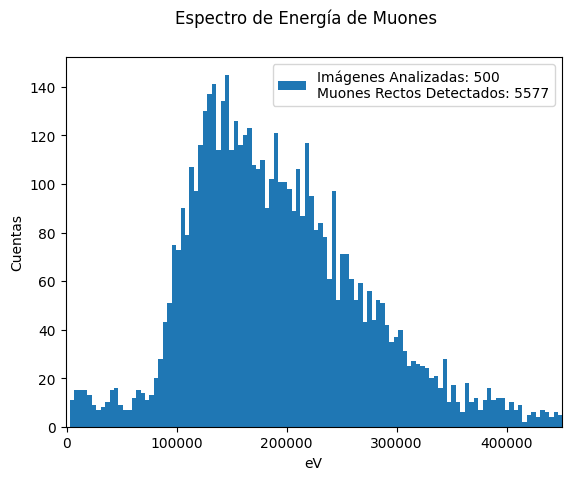

In [ ]:
EMP = 152000
altura = 590
xi = 40000
eps = 1000
histogram = open('histogram_Imgs_500_Sol_0.7_Elip_4.5_fit.pkl', 'rb')
exampleObj = pickle.load(histogram)
exampleObj.axes[0].set_xlim([-1000,450000])
x = np.arange(0, 400000, 1)
y = Landgauss(x,altura, EMP, xi,eps)
strLaundau = 'EMP: '+ str(EMP) + ', xi: ' + str(xi) 
plt.plot(x,y,'r', label= strLaundau)
plt.legend()
histogram.close()

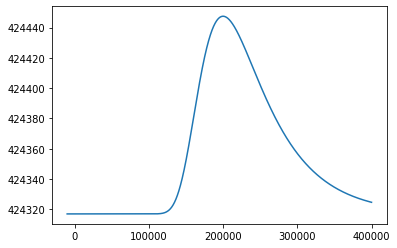

In [ ]:
x = np.arange(-10000, 400000, 1)
y = Landgauss(x, 540,200000,30000)
plt.plot(x,y)

# DataFrames de Muones de todas las extensiones 

In [ ]:
expgain = [227, 220.4, 94.72, 197.7]
list_labels = []
list_EventsNumber = []
list_ExensionDataFrame = []
list_EventCharge_AllExtensions = []
list_eventos_rectos_ALLExtensions = []

path = ['/home/labdet/Documents/MauSan/imagenesMicrochip/14JUN23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_NROW_700_NCOL_700_EXPOSURE_1200_NBINROW_1_NBINCOL_1_img_7.fits']
# path = ['/home/labdet/Documents/MauSan/imagenesMicrochip/14JUN23/proc_skp_m-009_microchip_T_170__Vv82_NSAMP_1_']

for img in path:
    hdu_list = fits.open(img)
    
    for extension in range(0,4):

        ## Lists for fill DataFrame ##
        list_Runid = []
        list_ext = []
        list_Matrix_Slice_Event = []
        list_Size_Matrix_Event = []
        list_event_size = []
        list_charge = []
        list_mean_charge = []
        list_Barycenter = []
        list_n_events = []
        list_eventos_rectos = []

        data = hdu_list[extension].data
        header=hdu_list[extension].header
        oScan=hdu_list[extension].data[638:,530:]
        nsamp=float(header['NSAMP'])
        Runid = str(header['RUNID'])

        hist , bins_edges = np.histogram(oScan.flatten(), bins = 'auto')
        offset = bins_edges[np.argmax(hist)]
        dataP = data-offset
        dataCal = dataP/expgain[extension] ## En electrones  

        bin_heights, bin_borders = np.histogram(dataCal.flatten(), bins= 'auto') 
        bin_centers=np.zeros(len(bin_heights), dtype=float)
        offset_fit = bin_borders[np.argmax(bin_heights)]
        for p in range(len(bin_heights)):
            bin_centers[p]=(bin_borders[p+1]+bin_borders[p])/2

        xmin_fit, xmax_fit = offset_fit-(10*expgain[extension-1])/math.sqrt(nsamp), offset_fit+(10*expgain[extension-1])/math.sqrt(nsamp)			# Define fit range
        bin_heights = bin_heights[(bin_centers>xmin_fit) & (bin_centers<xmax_fit)]
        bin_centers = bin_centers[(bin_centers>xmin_fit) & (bin_centers<xmax_fit)]

        popt,_ = curve_fit(gaussian, bin_centers, bin_heights)#, p0=[np.max(bin_heights), 0, 1], maxfev=100000)		# Fit histogram with gaussian

        # label, n_events =ndimage.label(dataCal>6*abs(popt[2]),structure=[[1,1,1],[1,1,1],[1,1,1]])
        label_img, n_events = sk.measure.label(dataCal>6*popt[2], background=6*popt[2], connectivity=2, return_num=True)
        prop = sk.measure.regionprops(label_img, dataCal)
        
        # print(nlabels_img)
        list_labels.append(label_img)
        list_EventsNumber.append(n_events)
        
        ## Obteniendo el valor promedio del fondo
        fondo_mask = np.invert(label_img == 0)
        fondo = ma.masked_array(dataCal,fondo_mask)
        valor_promedio_fondo = fondo.data.mean()

        for event in range(0,n_events):
            if prop[event].axis_major_length > 4.5 * prop[event].axis_minor_length:
                # list_n_events.append(event)
                list_eventos_rectos.append(event+1)

                mask = np.invert(label_img == event+1)
                loc = prop[event].slice
                # loc = ndimage.find_objects(label==i)[0]
                
                data_maskEvent = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])

                ## Número de imagen
                list_Runid.append(Runid)

                ## Número de Extensión
                list_ext.append(extension+1) ## The extension's number is 1,2,3 or 4.

                ## Lista de Coordenadas de cada evento
                list_Size_Matrix_Event.append(str(data_maskEvent.shape[1])+'x'+str(data_maskEvent.shape[0])) ## La dimensión de la matriz del evento en pixeles

                event_size = 0
                # Obtiene los pixeles que componen al evento
                for i in range(0,len(data_maskEvent.flatten())):
                    if data_maskEvent.flatten()[i]:
                        event_size = event_size+1
                list_event_size.append(int(event_size))
                # print(list_event_size)

                # Obtiene la carga total en electrones si el evento es recto 
                charge = 0
                for i in data_maskEvent.data.flatten():
                    if i >= valor_promedio_fondo:
                        charge = charge + i
                # list_charge.append(data_maskEvent.sum())
                list_charge.append(charge)
                list_EventCharge_AllExtensions.append(charge)

                # Carga promedio en electrones
                try:
                    mean_charge = charge/event_size
                    list_mean_charge.append(round(mean_charge,3))
                except:
                    list_mean_charge.append('None Event Size')
                    continue
                

                ## Barycenter
                coordX_Barycenter = round(ndimage.center_of_mass(data_maskEvent)[1],4)
                coordY_Barycenter = round(ndimage.center_of_mass(data_maskEvent)[0],4)
                list_coordBarycenter = [coordX_Barycenter,coordY_Barycenter ]
                list_Barycenter.append(list_coordBarycenter)

                RunidFrame = pd.DataFrame(list_Runid, columns = ['Image ID'])
                ExtensionFrame = pd.DataFrame(list_ext, columns = ['Extension'])
                Event_IDFrame= pd.DataFrame(list_eventos_rectos, columns = ['Event ID'])
                Matrix_Size_EventFrame = pd.DataFrame(list_Size_Matrix_Event, columns = ['Matrix Size (px)'])
                Event_SizeFrame = pd.DataFrame(list_event_size, columns = ['Event Size (px)'])
                ChargeFrame = pd.DataFrame(list_charge, columns = ['Total Charge (e-)'])
                MeanChargeFrame = pd.DataFrame(list_mean_charge, columns = ['Mean Charge (e-)'])

                totalFrame = pd.concat([Event_IDFrame,RunidFrame, ExtensionFrame, Matrix_Size_EventFrame, Event_SizeFrame, ChargeFrame, MeanChargeFrame], axis = 1 )
                totalFrame['Barycenter'] = pd.Series(list_Barycenter)
                
        list_eventos_rectos_ALLExtensions.append(list_eventos_rectos)
        list_ExensionDataFrame.append(totalFrame.set_index('Event ID'))

In [ ]:
# plt.imshow(list_labels[3]==0)
print("Eventos Detectados por Extensión: ", list_EventsNumber)
print("Eventos Rectos por Extensión: ", len(list_eventos_rectos_ALLExtensions[0]), len(list_eventos_rectos_ALLExtensions[1]), len(list_eventos_rectos_ALLExtensions[2]), len(list_eventos_rectos_ALLExtensions[3]))
print("Total de Eventos detectados en la imagen: ", sum(list_EventsNumber))
print("Total de Eventos Rectos detectados: ",len(list_eventos_rectos_ALLExtensions[0])+ len(list_eventos_rectos_ALLExtensions[1])+len(list_eventos_rectos_ALLExtensions[2])+len(list_eventos_rectos_ALLExtensions[3]))

## Muestra el DataFrame de eventos rectos seleccionando la extensión
# list_ExensionDataFrame[1]


Eventos Detectados por Extensión:  [55, 60, 0, 79]
Eventos Rectos por Extensión:  19 19 0 23
Total de Eventos detectados en la imagen:  194
Total de Eventos Rectos detectados:  61


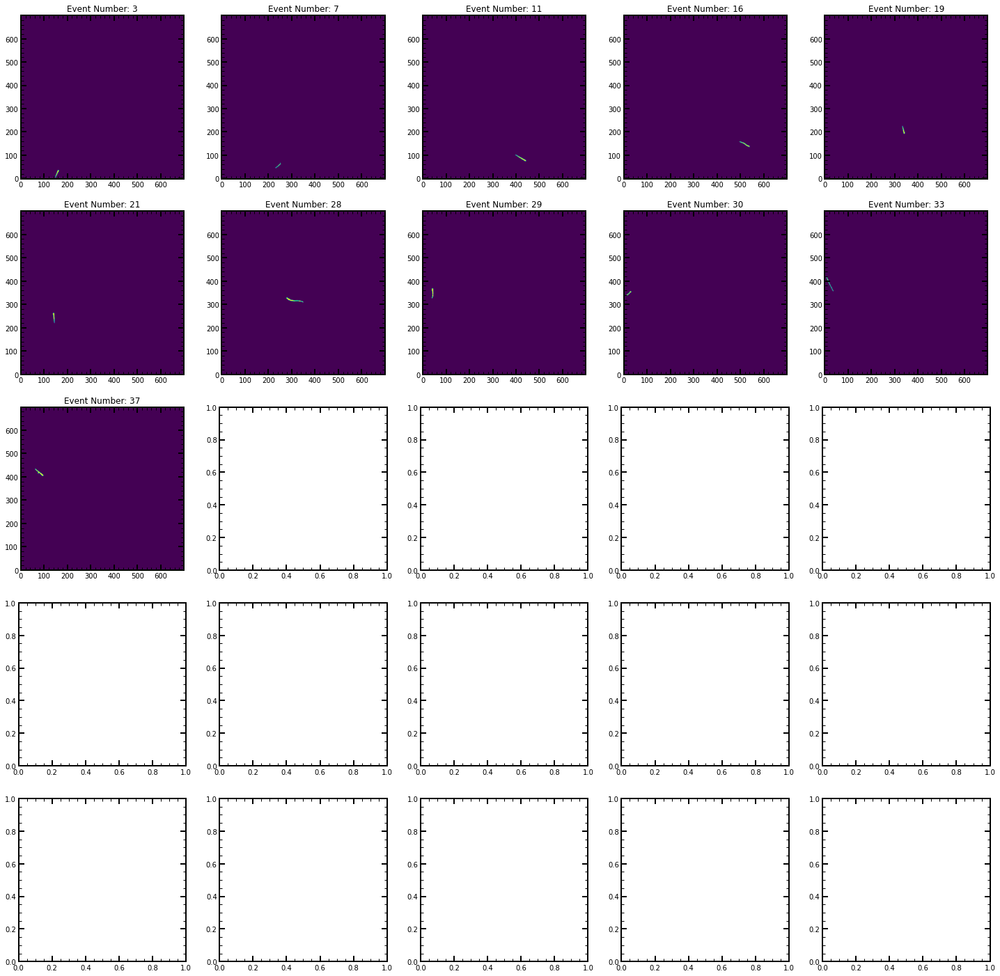

In [ ]:
fig, axs = plt.subplots(ncols = 5, nrows=5, figsize=(25,25))
coords = [[0,0],[0,1], [0,2], [0,3], [0,4], [1,0], [1,1], [1,2], [1,3], [1,4], [2,0], [2,1], [2,2], [2,3], [2,4], [3,0], [3,1], [3,2], [3,3], [3,4],
          [4,0], [4,1], [4,2], [4,3], [4,4]]
for index_event in range(0,len(list_eventos_rectos_ALLExtensions[0])):
    # loc = prop[list_eventos_rectos_ALLExtensions[0][index_event]].slice
    # mask_35 = np.invert(label_img == n_label)
    # data_mask = ma.masked_array(dataCal[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop], mask_35[loc[0].start:loc[0].stop, loc[1].start:loc[1].stop])
    # plt.imshow(dataCal[maxim.start:maxim.stop])
    # ax.imshow(data_mask)

    axs[coords[index_event][0],coords[index_event][1]].imshow(list_labels[0] == list_eventos_rectos_ALLExtensions[0][index_event])
    axs[coords[index_event][0],coords[index_event][1]].set_title('Event Number: '+ str(list_eventos_rectos_ALLExtensions[0][index_event]))
    # axs[0, index_event].axis((loc[1].start-ext, loc[1].stop+ext, loc[0].start-ext, loc[0].stop+ext))

(array([10.,  0.,  0.,  2.,  5.,  7.,  5.,  2.,  2.,  1.,  1.,  0.,  0.,
         0.,  1.,  1.,  3.,  2.,  2.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([7.04185638e+01, 8.45369979e+03, 1.68369810e+04, 2.52202622e+04,
        3.36035435e+04, 4.19868247e+04, 5.03701059e+04, 5.87533871e+04,
        6.71366684e+04, 7.55199496e+04, 8.39032308e+04, 9.22865120e+04,
        1.00669793e+05, 1.09053074e+05, 1.17436356e+05, 1.25819637e+05,
        1.34202918e+05, 1.42586199e+05, 1.50969481e+05, 1.59352762e+05,
        1.67736043e+05, 1.76119324e+05, 1.84502606e+05, 1.92885887e+05,
        2.01269168e+05, 2.09652449e+05, 2.18035730e+05, 2.26419012e+05,
        2.34802293e+05, 2.43185574e+05, 2.51568855e+05, 2.59952137e+05,
        2.68335418e+05, 2.76718699e+05, 2.85101980e+05, 2.93485261e+05,
        3.

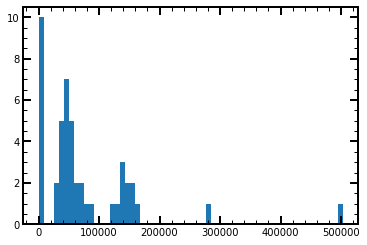

In [ ]:
# hist, bins = np.histogram(list_EventCharge_AllExtensions)
# print(hist)
# print(bins[1:])
# poptimo,_ = curve_fit(EnergySpectrum,bins[1:], hist )
# print(poptimo)

# # x = np.arange(0, 200000)
# y = []
# for i in bins[1:]:
#     s = EnergySpectrum(i, poptimo[0])
#     y.append(s)

plt.hist(list_EventCharge_AllExtensions, bins=60)   
# plt.plot(hist,y) 
# plt.xlim(-10000,150000)


# Prueba con 'skimage.measure.regionprops_table'

Events:  64
Eventos Rectos:  [3, 10, 14, 18, 25, 27, 34, 36, 37, 45, 49, 50, 53, 54, 55, 56, 57]


,axis_major_length,axis_minor_length,eccentricity,euler_number,centroid-0,centroid-1,feret_diameter_max
label,,,,,,,
1,7.416722,3.039597,0.912162,1,2.888889,8.833333,7.071068
2,15.445063,11.632133,0.657872,1,4.508197,157.688525,18.027756
3,38.093797,4.033484,0.994379,1,7.980392,512.284314,35.014283
4,15.370270,4.976849,0.946127,1,19.654545,443.200000,15.231546
5,2.309401,1.333333,0.816497,1,84.333333,84.333333,2.236068
...,...,...,...,...,...,...,...
60,0.000000,0.000000,0.000000,1,622.000000,8.000000,1.000000
61,4.318667,3.679465,0.523557,1,626.384615,221.384615,4.472136
62,2.000000,0.000000,1.000000,1,634.500000,8.000000,2.000000


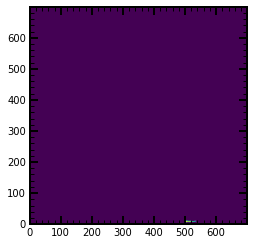

In [ ]:
n_label= 3

label_img, nlabels_img = sk.measure.label(dataCal>6*popt[2], background=6*popt[2], connectivity=2, return_num=True)
print('Events: ', nlabels_img)
print('Eventos Rectos: ', eventos_rectos)
plt.imshow(label_img==n_label) # Matriz centrada en el origen

prop = sk.measure.regionprops_table(label_img,dataCal, properties=['label', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'euler_number', 'centroid', 'feret_diameter_max'])

DataProp = pd.DataFrame(prop)
DataProp.set_index('label')

# Getting only the High Energy Events

In [ ]:
def sum_intensity(region, intensities):
    return np.sum(intensities[region])

rps=sk.regionprops(label,intensity_image=data[0],cache=False, extra_properties=[sum_intensity])
areas=[r.area for r in rps]
energy=[r.sum_intensity for r in rps]
centr=[r.weighted_centroid for r in rps]
ecce=[r.eccentricity for r in rps]
dic_props={"areas":areas,"energias":energy,'centroid':centr, "excentricidade":ecce}

ValueError: Label and intensity image shapes must match, except for channel (last) axis.

In [ ]:
import skimage as ski
ski.__version__

'0.18.3'

In [ ]:
df=pd.DataFrame.from_dict(dic_props)
df.index = np.arange(1, len(df)+1)
# df.head(35) #show dataframe

In [ ]:
energias=dic_props["energias"]
exce=dic_props["excentricidade"]
hee_list=np.where((np.array(energias)>80) & (np.array(exce)!=1))[0].tolist() #index od the dictionary of events ---> TRESHOLD OF 80 ELECTRONS TO BE HE

In [ ]:
areas=dic_props["areas"]
see_list=np.where((np.array(exce)==1) & (np.array(areas)>9))[0].tolist() 
see_list

[]

In [ ]:
label

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

Getting there positions

In [ ]:
HE_events=np.zeros_like(label)
for event in hee_list:
    [x,y]=np.where(label==event+1)
    for i in range(len(x)):
        HE_events[x[i],y[i]]=1

In [ ]:
SRE_events=np.zeros_like(label)
for event in see_list:
    [x,y]=np.where(label==event+1)
    for i in range(len(x)):
        SRE_events[x[i],y[i]]=1

TypeError: Invalid shape (700,) for image data

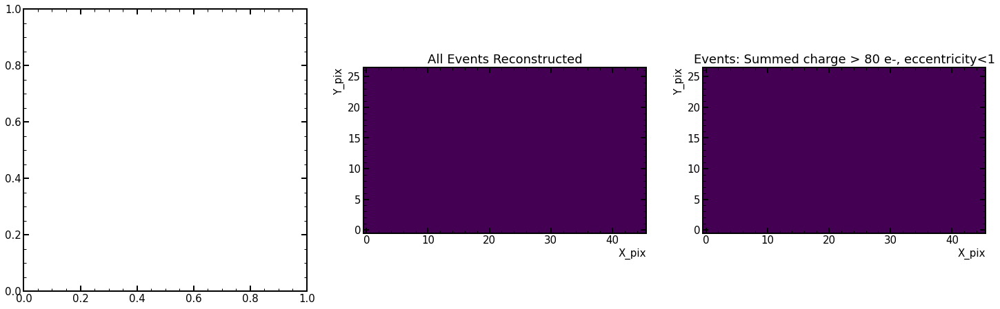

In [ ]:
fig=plt.figure(figsize=(25,15))
plt.subplot(133)
plt.imshow(HE_events)
plt.title('Events: Summed charge > 80 e-, eccentricity<1')
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
# plt.colorbar()
plt.subplot(132)
plt.title('All Events Reconstructed')
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.imshow(label!= 0)
plt.subplot(131)
plt.imshow(data[0],vmin=-1,vmax=1)
plt.title('Original Image')
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
# plt.savefig('IMAGES_RECOHE.png', bbox_inches='tight', dpi=100)

plt.show()

In [ ]:
mask_bleeding=ndimage.binary_dilation(HE_events>0,structure=[[0,0,0],[0,1,1],[0,0,0]],
                                             iterations=40)*1.0#-(HE_events>0)*1.0

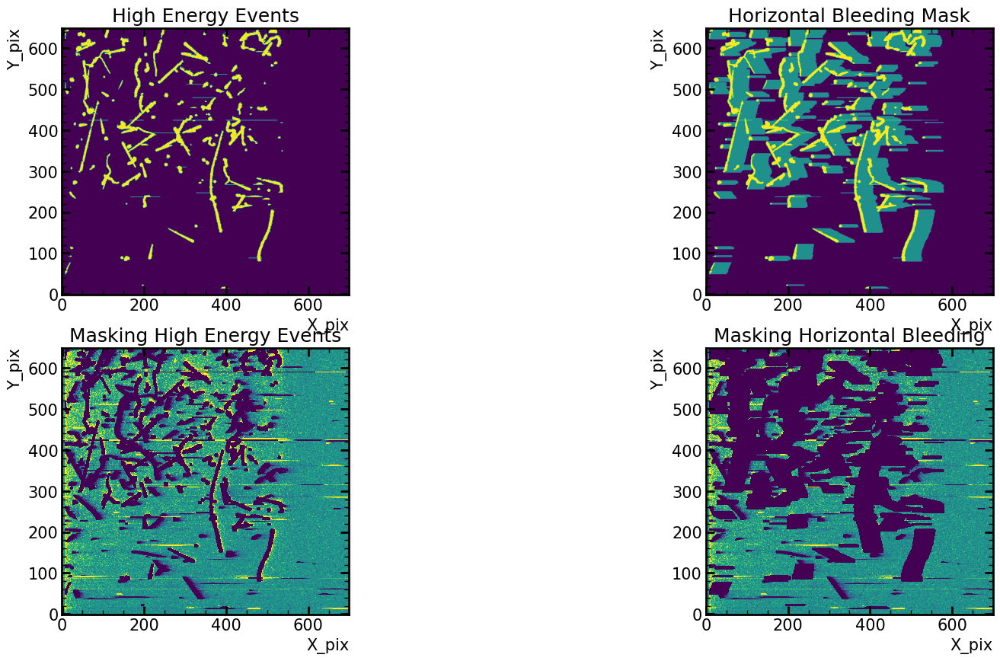

In [ ]:
plt.figure(figsize=(20,10))
# plt.subplot(223)
# plt.imshow(data[0],vmin=-1,vmax=1)
# plt.title('Original Image')
plt.subplot(221)
plt.imshow(HE_events)
plt.title('High Energy Events')
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.subplot(222)
plt.imshow(mask_bleeding+(HE_events>0)*1)
plt.title('Horizontal Bleeding Mask')

plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.subplot(223)
plt.imshow(data[0]+((HE_events>0))*-1e7,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')

# plt.colorbar()
plt.title('Masking High Energy Events')
plt.subplot(224)
plt.imshow(data[0]+((mask_bleeding+HE_events>0))*-1e7,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')

plt.title('Masking Horizontal Bleeding')
#plt.savefig('IMAGES_HBLEED.png', bbox_inches='tight', dpi=100)

plt.show()

In [ ]:
maskV_bleeding=ndimage.morphology.binary_dilation(HE_events>0,structure=[[0,0,0],[0,1,0],[0,1,0]],
                                             iterations=20)*1.0#-(HE_events>0)*1.0

/tmp/ipykernel_19252/684858339.py:1: DeprecationWarning: Please use `binary_dilation` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  maskV_bleeding=ndimage.morphology.binary_dilation(HE_events>0,structure=[[0,0,0],[0,1,0],[0,1,0]],


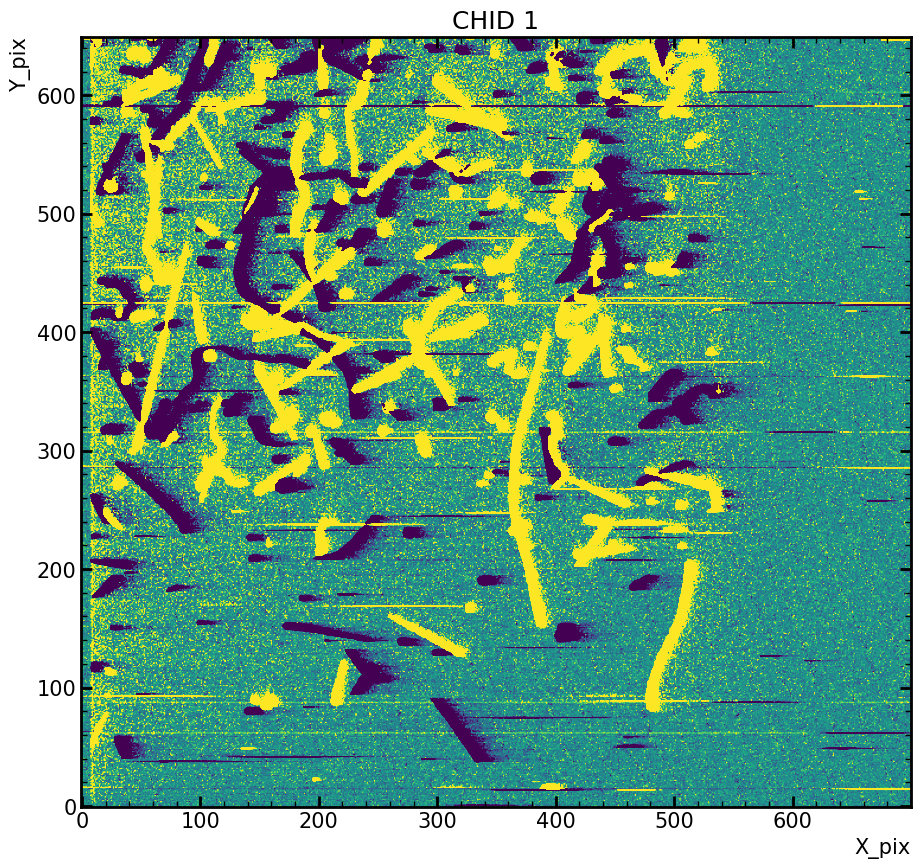

In [ ]:
fig=plt.figure(figsize=(15,10))
plt.imshow(data[0],vmin=-1,vmax=1)
plt.title('CHID 1')
# plt.savefig('IMAGES_chid1.png', bbox_inches='tight', dpi=100)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.show()

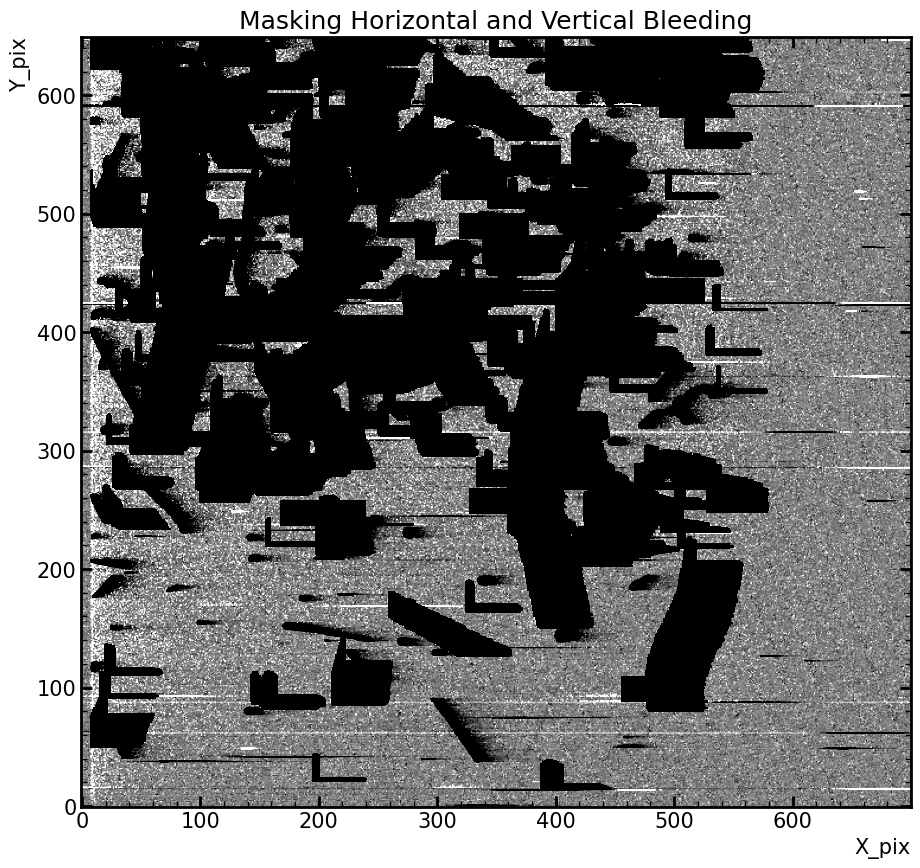

In [ ]:
fig=plt.figure(figsize=(15,10))
# plt.imshow(data[0]+((maskV_bleeding+mask_bleeding+HE_events>0))*-1e7,vmin=-1,vmax=1, cmap='gray')
plt.imshow(data[0]+((maskV_bleeding+mask_bleeding+HE_events>0))*-1e7,vmin=-1,vmax=1, cmap='gray')
plt.title('Masking Horizontal and Vertical Bleeding')
plt.ylabel('Y_pix')
plt.xlabel('X_pix')

#plt.savefig('IMAGES_BLEED.png', bbox_inches='tight', dpi=100)

plt.show()

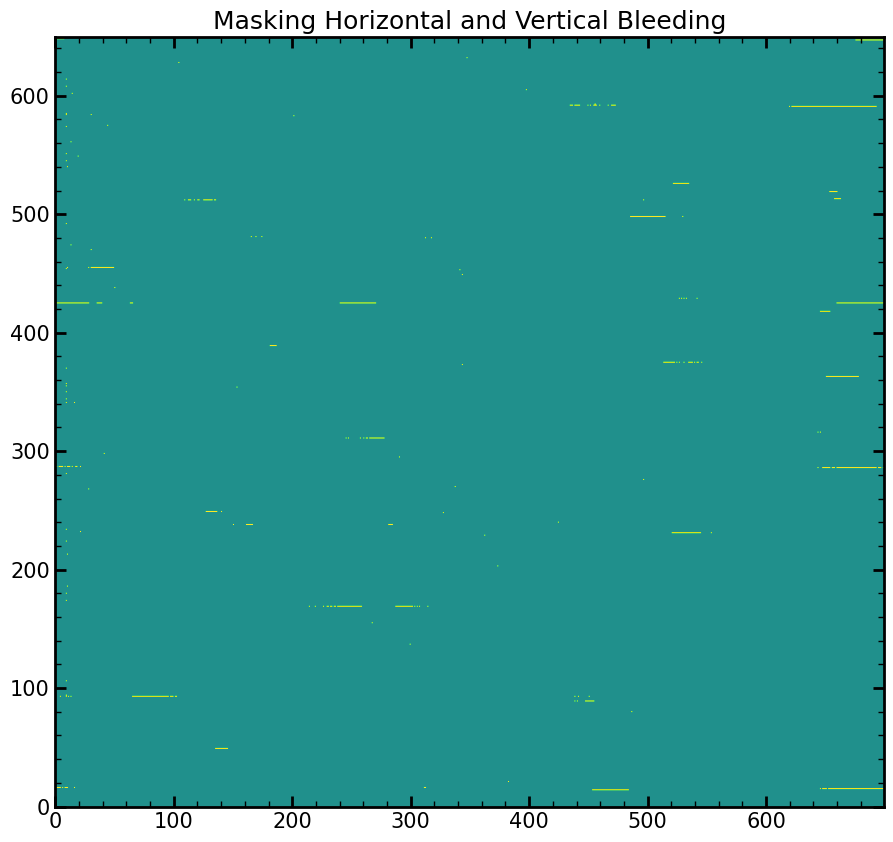

In [ ]:
plt.figure(figsize=(15,10))
plt.imshow((data[0]+((maskV_bleeding+mask_bleeding+HE_events>0))*-1e7)>4,vmin=-1,vmax=1)
plt.title('Masking Horizontal and Vertical Bleeding')
plt.show()

In [ ]:
matriz2, dmask=no_sr(data[0]+((maskV_bleeding+mask_bleeding+HE_events))*-1e7,threshold=3,trem=20)

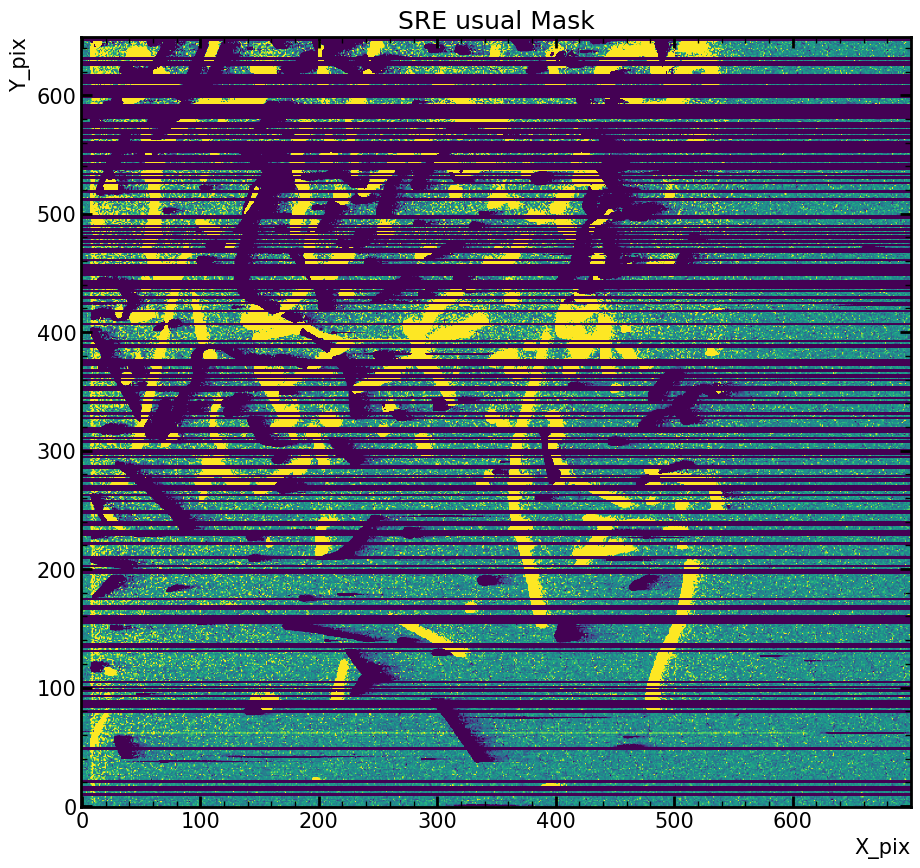

In [ ]:
fig=plt.figure(figsize=(15,10))
plt.imshow(data[0]-dmask*1e7,vmin=-1,vmax=1)
plt.title('SRE usual Mask')
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
#plt.savefig('IMAGES_SRE_std.png', bbox_inches='tight', dpi=100)
plt.show()

In [ ]:
pre_sre=ndimage.label((data[0]+((maskV_bleeding+mask_bleeding+HE_events))*-1e7)>1.5,structure=[[0,0,0],[1,1,1],[0,0,0]])[0]

In [ ]:
rps=sk.regionprops(pre_sre,cache=False)
areas=[r.area for r in rps]

SRE_events=np.zeros_like(pre_sre)
for event in np.where(np.array(areas)>1)[0].tolist():
    [x,y]=np.where(pre_sre==event+1)
    for i in range(len(x)):
        SRE_events[x[i],y[i]]=1

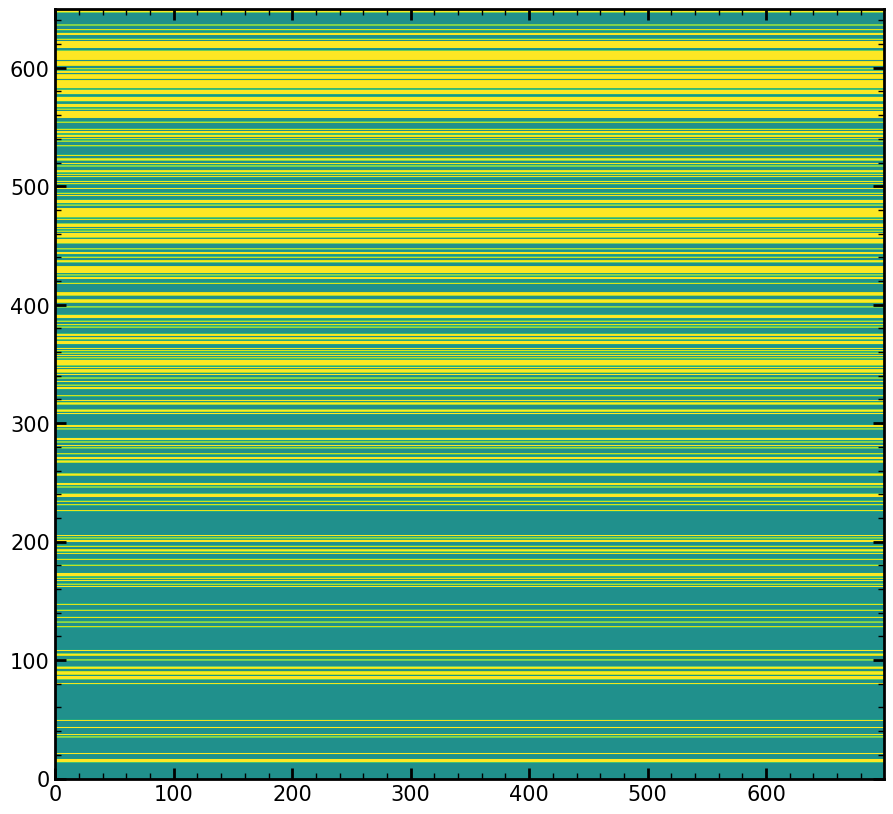

In [ ]:
SRE_mask=np.zeros_like(SRE_events)
for y in np.unique(np.where(SRE_events==1)[0]).tolist(): SRE_mask[y,:]=1
plt.figure(figsize=(15,10))
plt.imshow(SRE_mask,vmin=-1,vmax=1)
plt.show()

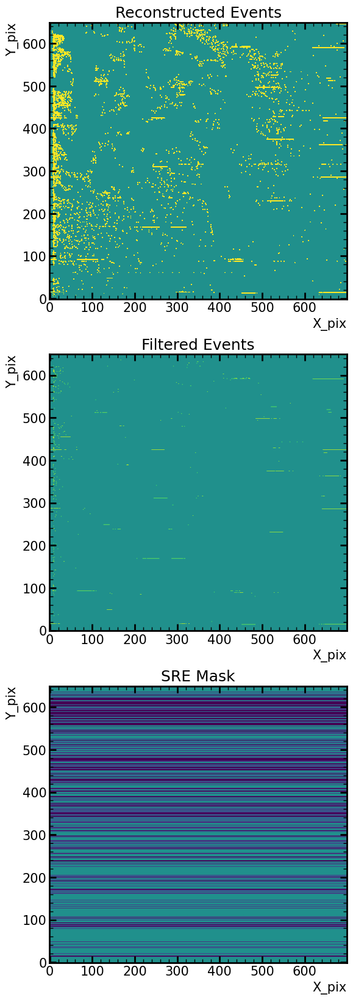

In [ ]:
plt.figure(figsize=(25,20))
plt.subplot(311)
plt.imshow(pre_sre,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('Reconstructed Events')
plt.subplot(312)
plt.imshow(SRE_events,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('Filtered Events')
plt.subplot(313)
plt.imshow(-SRE_mask,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('SRE Mask')
# plt.savefig('IMAGES_SRE_pre.png', bbox_inches='tight', dpi=100)

plt.show()

In [ ]:
np.unique(np.where(SRE_events==1)[0])

array([ 14,  15,  16,  21,  35,  37,  43,  49,  80,  84,  85,  86,  88,
        89,  90,  93,  94, 100, 104, 105, 108, 128, 132, 136, 142, 147,
       162, 164, 167, 169, 171, 172, 173, 180, 185, 190, 192, 193, 196,
       200, 201, 203, 205, 226, 231, 234, 238, 239, 240, 246, 248, 249,
       256, 257, 267, 268, 270, 271, 274, 279, 281, 284, 286, 287, 295,
       297, 298, 308, 310, 311, 316, 317, 319, 323, 329, 330, 332, 335,
       338, 341, 343, 344, 345, 347, 349, 350, 351, 352, 353, 355, 357,
       359, 361, 363, 367, 368, 369, 371, 372, 374, 375, 381, 383, 386,
       389, 390, 391, 398, 402, 403, 404, 408, 409, 410, 418, 422, 423,
       425, 427, 428, 429, 430, 431, 432, 436, 437, 440, 443, 444, 447,
       452, 453, 454, 455, 457, 458, 459, 460, 462, 464, 466, 467, 468,
       472, 474, 475, 476, 477, 478, 479, 480, 481, 484, 486, 487, 488,
       492, 494, 498, 502, 504, 508, 510, 512, 513, 517, 519, 522, 523,
       526, 534, 538, 540, 542, 543, 545, 546, 548, 554, 558, 55

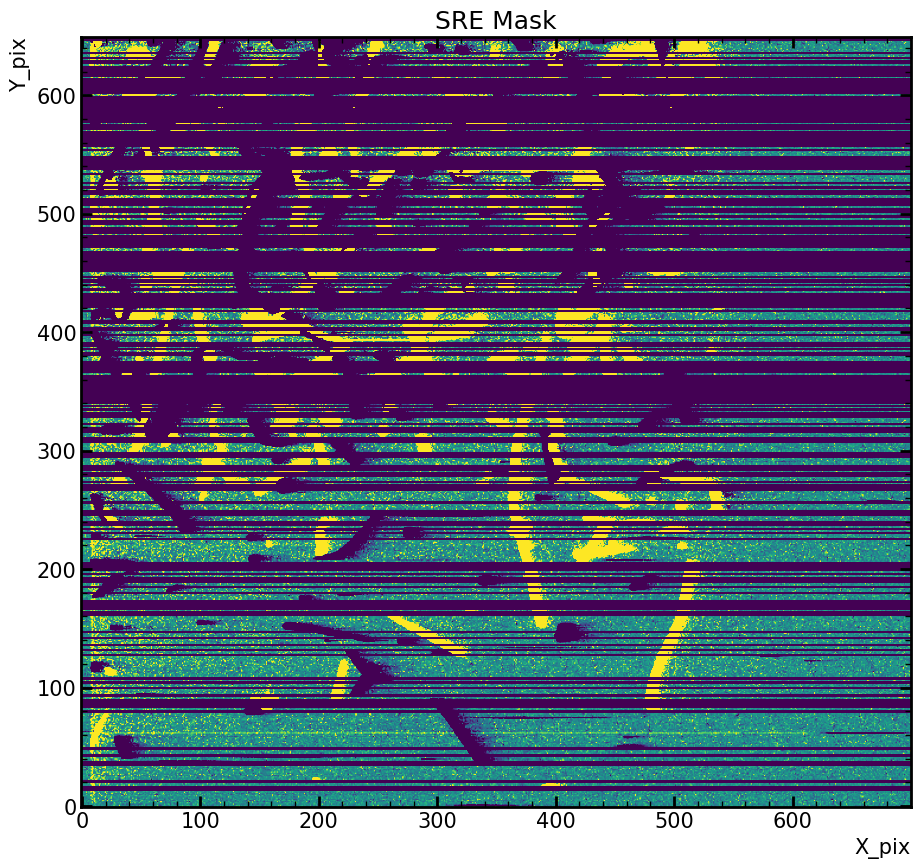

In [ ]:
fig=plt.figure(figsize=(15,10))
plt.imshow(data[0]-1e7*SRE_mask,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('SRE Mask')
#plt.savefig('IMAGES_SRE_MASK.png', bbox_inches='tight', dpi=100)
plt.show()

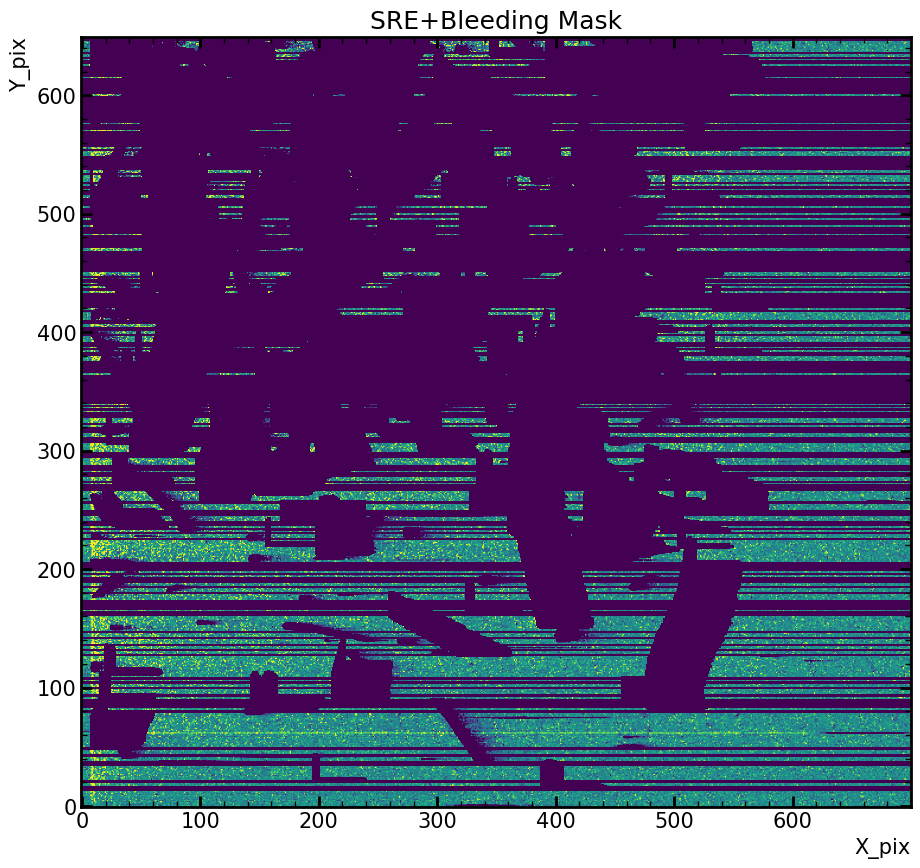

In [ ]:
fig=plt.figure(figsize=(15,10))
plt.imshow(data[0]-1e7*(maskV_bleeding+mask_bleeding+SRE_mask),vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('SRE+Bleeding Mask')

#plt.savefig('IMAGES_TOTALMASK.png', bbox_inches='tight', dpi=100)
plt.show()

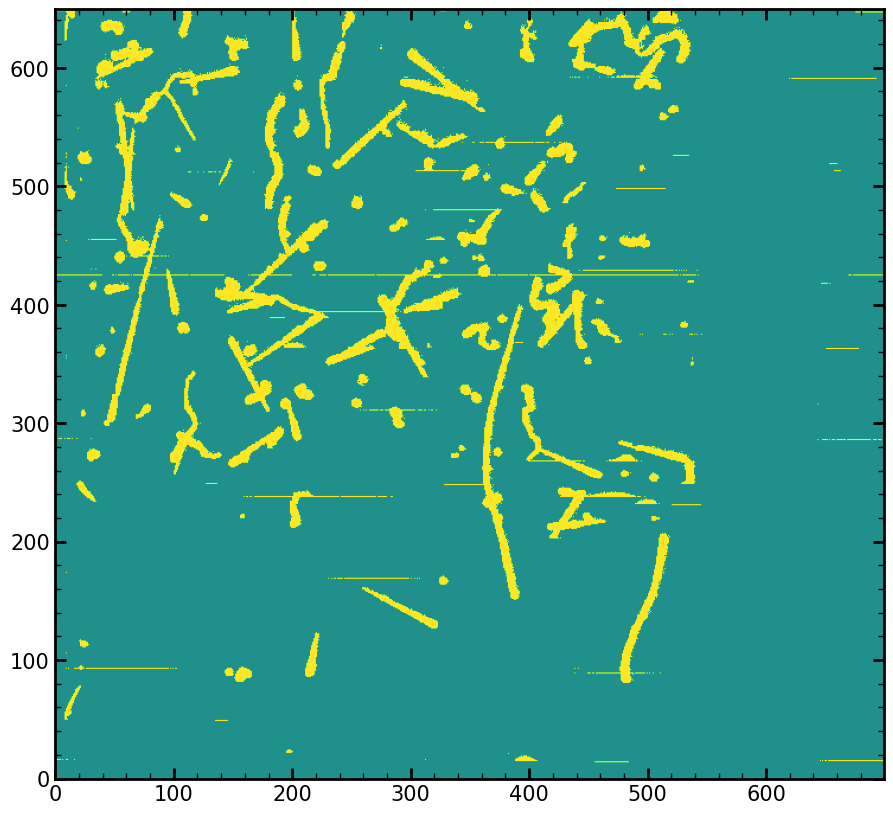

In [ ]:
plt.figure(figsize=(15,10))
plt.imshow(label!=0,vmin=-1,vmax=1)
plt.show()

In [ ]:
def sum_intensity(region, intensities):
    return np.sum(intensities[region])

rps=sk.regionprops(label,intensity_image=data[1],cache=False, extra_properties=[sum_intensity])
areas=[r.area for r in rps]
energy=[r.sum_intensity for r in rps]
centr=[r.weighted_centroid for r in rps]
ecce=[r.eccentricity for r in rps]
dic_props={"areas":areas,"energias":energy,'centroid':centr, "excentricidade":ecce}

In [ ]:
flag0=[]
for i in range(len(centr)):
    if int(centr[i][0]) not in np.unique(np.where(SRE_events==1)[0]).tolist():
        
        flag0.append(i)

In [ ]:
flag0_events=np.zeros_like(label)
for event in flag0:
    [x,y]=np.where(label==event+1)
    for i in range(len(x)):
        flag0_events[x[i],y[i]]=1

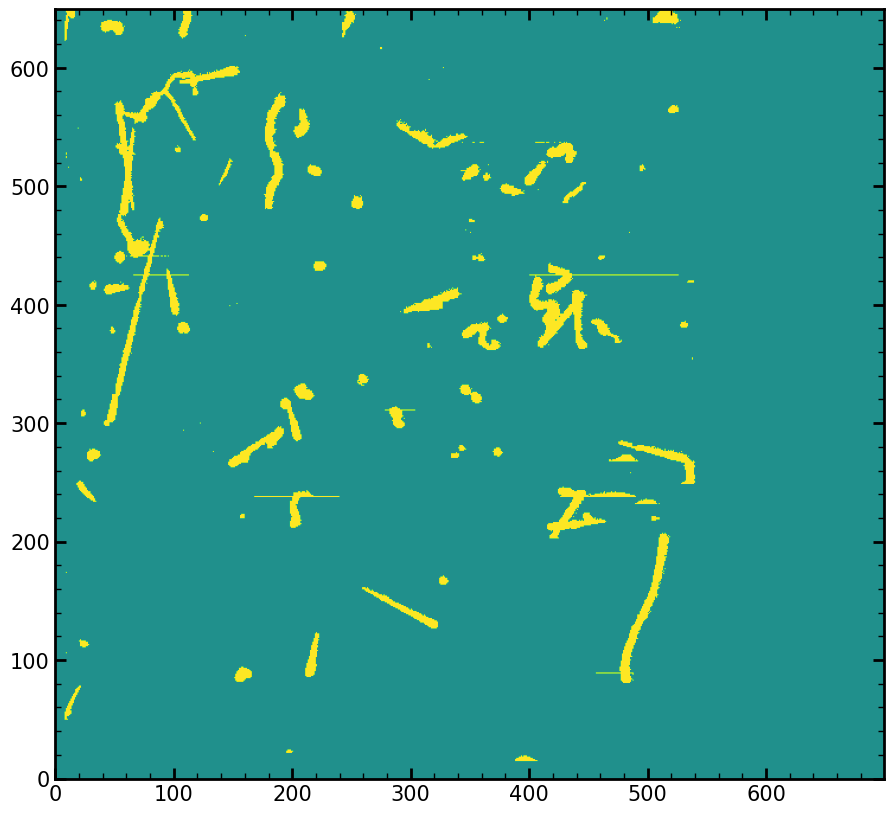

In [ ]:
plt.figure(figsize=(15,10))
plt.imshow(flag0_events,vmin=-1,vmax=1)
plt.show()

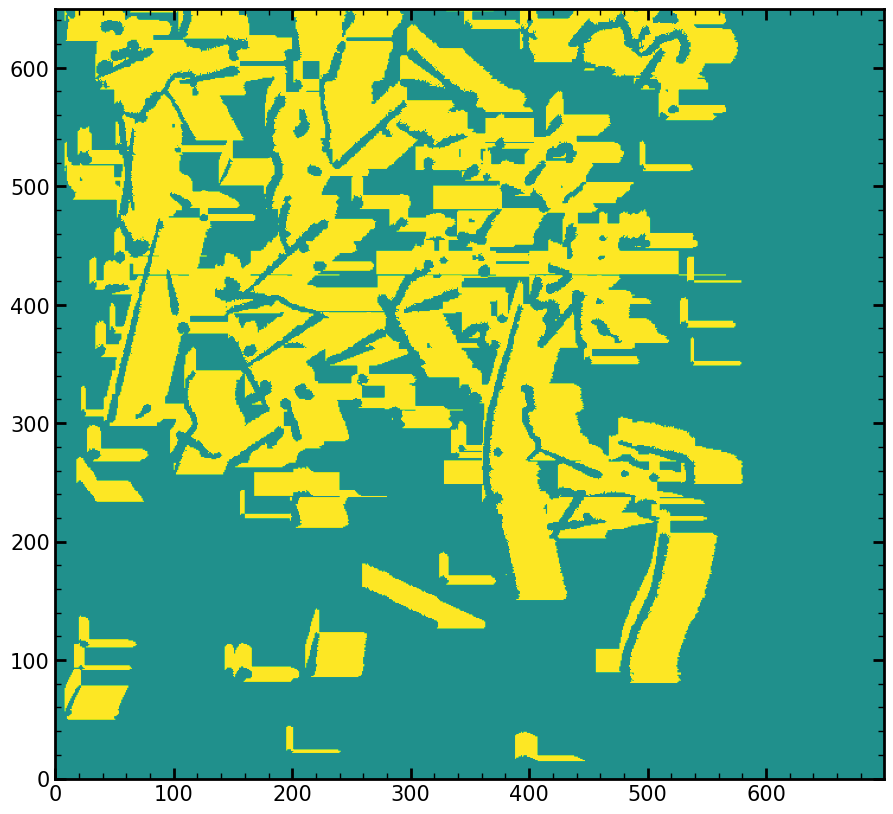

In [ ]:
plt.figure(figsize=(15,10))
plt.imshow(maskV_bleeding+mask_bleeding-2*HE_events,vmin=-1,vmax=1)
plt.show()

In [ ]:
type(centr[0] )

tuple

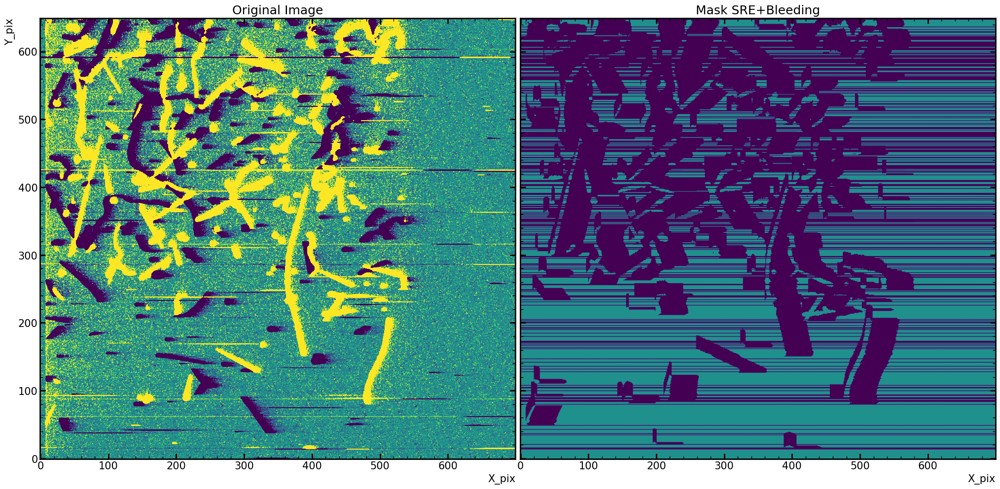

In [ ]:
fig=plt.figure(figsize=(25,15))
plt.subplot(121)
plt.title('Original Image')
plt.imshow(data[0],vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.subplot(122)
plt.imshow(-(maskV_bleeding+mask_bleeding-2*HE_events+SRE_mask),vmin=-1,vmax=1)
plt.title('Mask SRE+Bleeding')
plt.tick_params('y', labelleft=False)
plt.subplots_adjust(wspace=0.01)
plt.xlabel('X_pix')
#plt.savefig('Imageandmask.png', bbox_inches='tight', dpi=100)
plt.show()

# SINGLE ELECTRON RATE

In [ ]:
event_mask=maskV_bleeding+mask_bleeding
event_halo_mask = ndimage.binary_dilation(
        event_mask>0,
        iterations = 10,
        structure = ndimage.generate_binary_structure(rank=2, connectivity=2) # == [[1,1,1],[1,1,1],[1,1,1]]
    )
event_halo_SR_mask = np.array(SRE_mask,dtype=bool)|event_halo_mask

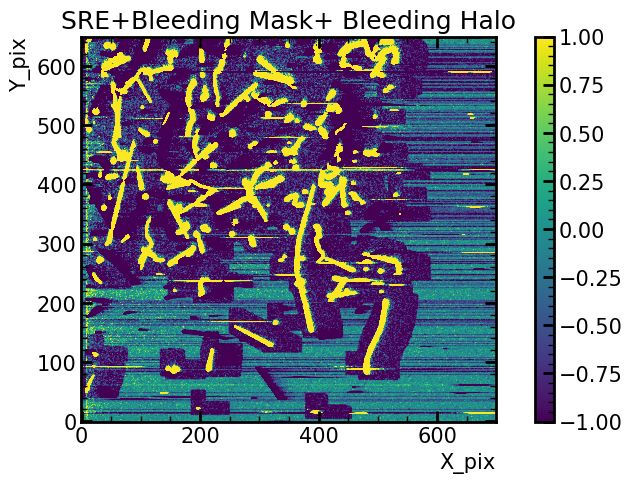

In [ ]:
fig=plt.figure(figsize=(10,5))
plt.imshow(data[0]-event_halo_SR_mask,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('SRE+Bleeding Mask+ Bleeding Halo')
#plt.savefig('SER.png', bbox_inches='tight', dpi=100)
plt.colorbar()
plt.show()

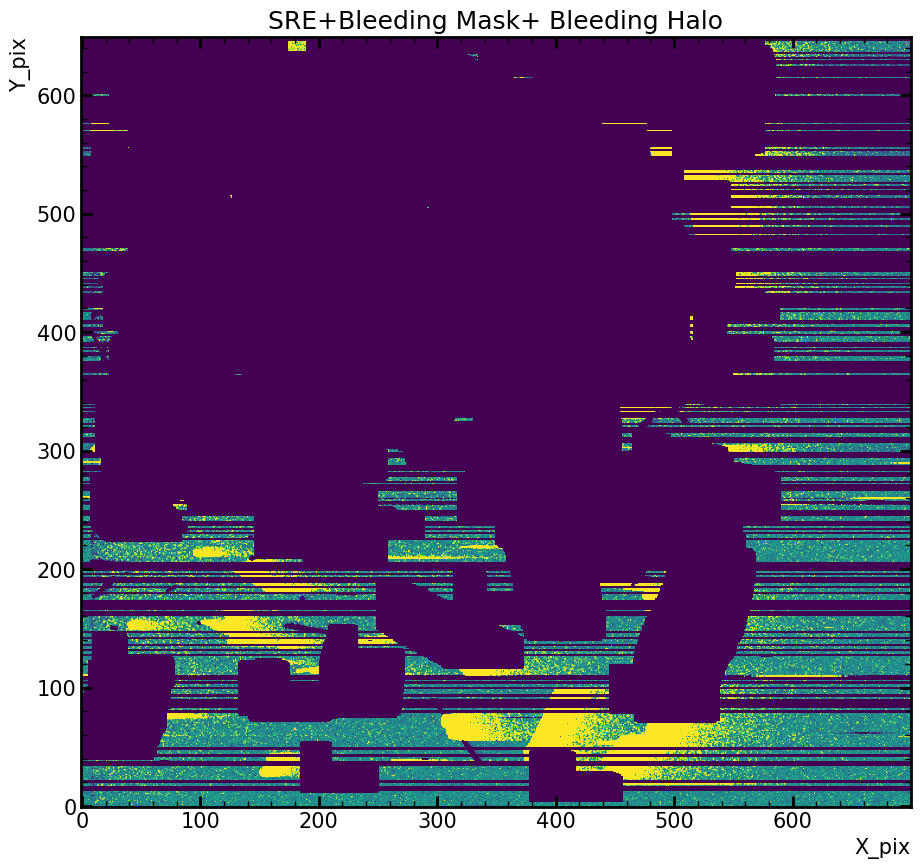

In [ ]:
fig=plt.figure(figsize=(15,10))
plt.imshow(data[1]-1e7*event_halo_SR_mask,vmin=-1,vmax=1)
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.title('SRE+Bleeding Mask+ Bleeding Halo')
plt.savefig('SER.png', bbox_inches='tight', dpi=100)
plt.show()

#### Convolution Mask is a slice of the size of the entire CCD. subtract the first and last 5 rows on vertical; and subtract the first 5 and last 5 plus overscan region
#### Masking process is using np.where, replacing the masked pixels by np.nan value
#### Making histogram

In [ ]:
convolution_mask = np.s_[5:int(hdu_list[1].header["CCDNROW"])-5, 15:-(osc+5)] #Means active area of entire CCD (slice(5, 1273, None), slice(15, -168, None)); if the slice is bigger it ok, there is no prob
masked_data = np.where(event_halo_SR_mask , np.nan, data[1] ) #aplying the mask to the data
masked_hist, bins = np.histogram( masked_data[convolution_mask], np.arange(-0.5, 2.5, .01) )
x = (bins[1:]+bins[:-1])/2 #get a mean value of the data and reshape, to adjust the size of the bins in histogram

In [ ]:
sigma_list, sigma_errLlist=LocalSigma(data,extensions=4)
global sigma
sigmaN=sigma_list[1]
def poisson_normN(x, mu, A, lamb, Nmax=5): #sigma parameter global 
    y = 0.
    for i in range(0, Nmax+1):
        y += (lamb**i)/float(math.factorial(i)) *np.exp(-0.5*((x-i-mu-lamb)/float(sigmaN))**2)
    return A*np.exp(-lamb)*y/(np.sqrt(2*np.pi*sigmaN**2))

In [ ]:

try:
    popt, pcov = curve_fit( 
        poisson_normN, 
        x, 
        masked_hist, 
        p0=[-0.4, 1000, 0.05],
    )
except (RuntimeError,OptimizeWarning,RuntimeWarning):
    print( f"Error - dc fit failed at" )

In [ ]:
print(popt)
chid=1
start=parse(hdu_list[chid].header["DATESTART"]+"Z").timestamp()
end=parse(hdu_list[chid].header["DATEEND"]+"Z").timestamp()
time=datetime.timedelta(seconds=end-start)
readout_time=time.total_seconds()/86400 #readout time in days

exposure_time=readout_time*int(hdu_list[chid].header["CCDNROW"])/(2*int(hdu_list[chid].header["NROW"]))
print(exposure_time)
perr = np.sqrt(np.diag(pcov))
dc = popt[2]/exposure_time # electron/pix/day
dc_err = perr[2]/exposure_time # electron/pix/day
print(dc,dc_err)

[-2.39241201e-01  5.11075359e+02  1.89626284e-01]
0.08326570512820514
2.2773635745761336 0.06709086956055965


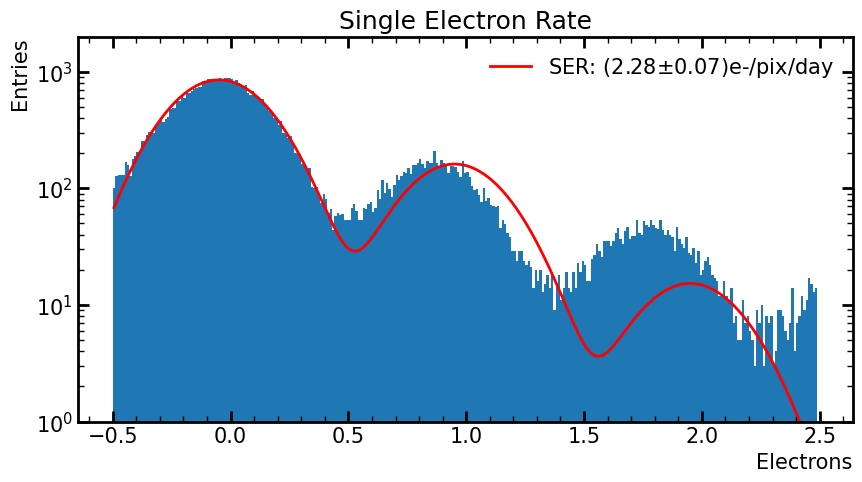

In [ ]:
fig=plt.figure(figsize=(10,5))
plt.bar(x,masked_hist,width=0.01)
plt.plot(x,poisson_normN(x,*popt),linewidth=2,c='r',label=r'SER: ({:.2f}$\pm${:.2f})e-/pix/day'.format(dc,dc_err))
plt.yscale('log')
plt.ylim(1,2e3)
plt.ylabel('Entries')
plt.xlabel('Electrons')
plt.title('Single Electron Rate')
plt.legend()
#plt.savefig('SER_HISTO.png', bbox_inches='tight', dpi=100)

plt.show()

## Spurious Charge

2.032777777777778
7318
6796.0738065934065


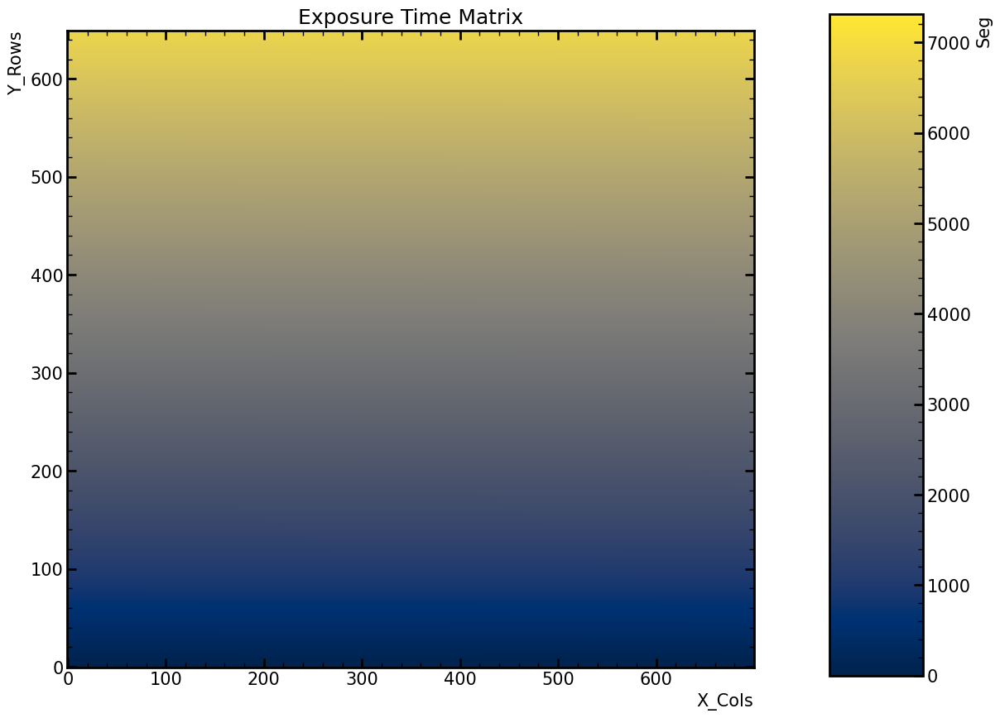

In [ ]:
ExpoMatrix, Ttot, NRow, NCol, NSamp= totTime(path)
fig=plt.figure(figsize=(15,10))
plt.subplot(1,1,1)

cmap = mpl.cm.cividis

#plt.imshow(ExpoMatrix,cmap=cmap,vmin=0,vmax=Ttot/3600) #Horas
plt.imshow(ExpoMatrix,cmap=cmap, vmin=0,vmax=Ttot) #Segundos

plt.title('Exposure Time Matrix')
plt.ylabel('Y_Rows')
plt.xlabel('X_Cols')

cax = plt.axes([0.85, 0.1, 0.075, 0.8])
plt.colorbar(cax=cax)
plt.ylabel('Seg')


# ExpoMatrix
print(Ttot/60/60)
print(Ttot)

print(ExpoMatrix.max())

HEF=0.01608351648352104 VEF=10.454285714285717


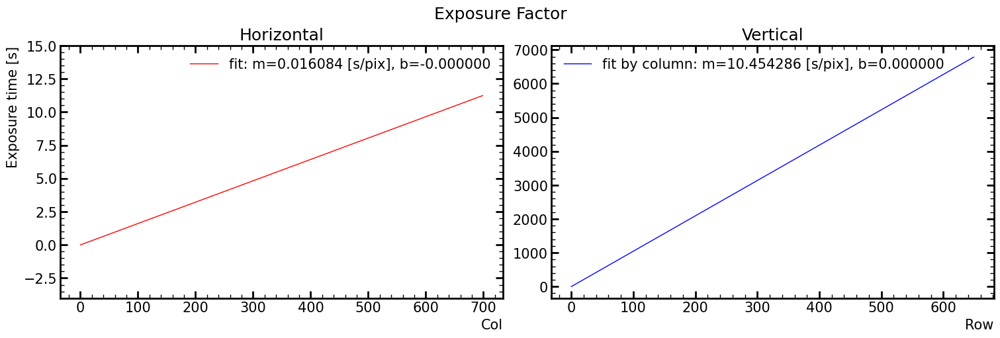

In [ ]:
HEF, VEF = exposureFactor(path) #Exposure Factor in [s/pix]

fig_all, axs_all = plt.subplots(nrows=1, ncols=2, figsize=(15, 5),constrained_layout=True)		# Create figures
fig_all.suptitle('Exposure Factor', fontsize='large')
axs_all[0].set_title('Horizontal')
axs_all[0].set_ylim([-4, 15])
axs_all[0].set_ylabel('Exposure time [s]')
axs_all[0].set_xlabel('Col')
axs_all[1].set_xlabel('Row')
axs_all[0].plot(range(0,len(ExpoMatrix[0])), line(range(0,len(ExpoMatrix[0])), HEF[0], HEF[1]),'r-', label='fit: m=%f [s/pix], b=%f' % tuple(HEF))


axs_all[0].legend()

axs_all[1].set_title('Vertical')
axs_all[1].plot(range(0,len(ExpoMatrix[:,0])), line(range(0,len(ExpoMatrix[:,0])), VEF[0], VEF[1]),'b-', label='fit by column: m=%f [s/pix], b=%f' % tuple(VEF))
axs_all[1].legend()
plt.show()

media on Row=-0.02007209824288352, stdDev on y=0.8323680534514376
Check
media on Col=0.005640947607287841, stdDev on y=0.09329060641788116


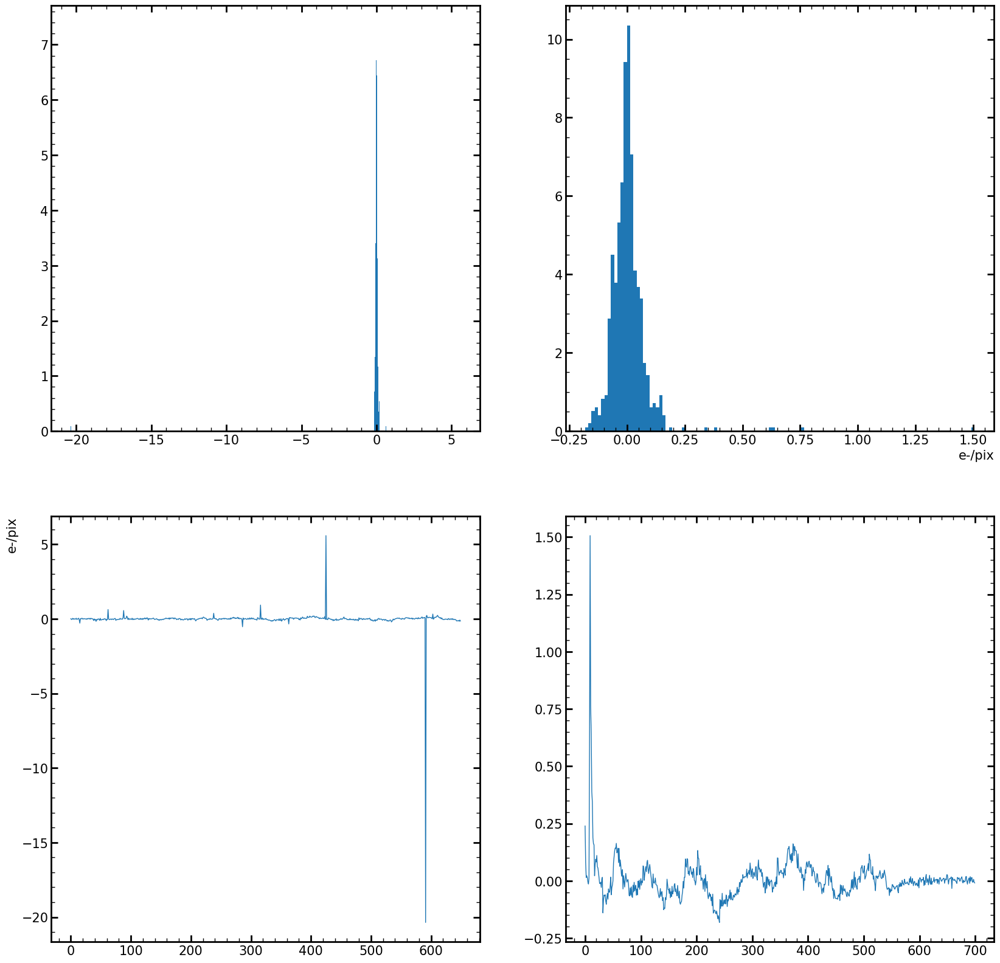

In [ ]:

data_masked=data[0]#-1e7*(maskV_bleeding+mask_bleeding+SRE_mask)
data_Row, data_Col, Row_bins, Col_bins, Row_hist, Col_hist = hist_RowColumn(data_masked)

fig_all, axs_all = plt.subplots(2, 2, figsize=(20, 20))		# Create figures


axs_all[0][0].hist(data_Row, Row_bins, density=True)

axs_all[0][1].hist(data_Col, Col_bins, density=True)

axs_all[1][0].plot(data_Row)

axs_all[1][1].plot(data_Col)

axs_all[1][0].set_ylabel('e-/pix')
axs_all[0][1].set_xlabel('e-/pix')

plt.show()


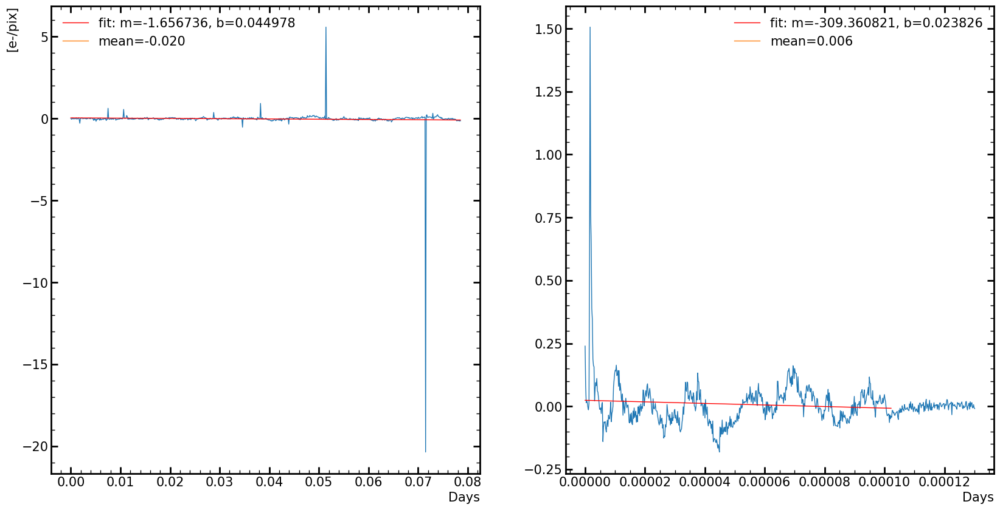

In [ ]:
#NROW650_NCOL700
fig_all, axs_all = plt.subplots(1, 2, figsize=(20, 10))		# Create figures
x_data=[]
i=0

for value in data_Row:  
            x_data.append(i)
            i+=1
Xdata=np.array(x_data)*VEF[0]/86400

axs_all[0].plot(Xdata, data_Row) #Xdata[Pix]*VEF[S/Pix], data_Row[e-]*86400[s/day]/VEF[s/pix]
popt, pcov = curve_fit(line, Xdata, data_Row)
axs_all[0].plot(Xdata, line(Xdata, popt[0], popt[1]), 'r-', label='fit: m=%f, b=%f' % tuple(popt)) #plot de xdata vs f(xdata)
rowValues=popt
axs_all[0].plot(np.mean(data_Row), label="mean=%5.3f" % np.mean(data_Row) )
axs_all[0].set_ylabel('[e-/pix]')
axs_all[0].set_xlabel('Days')
axs_all[0].legend()

x_data=[]
i=0

for value in data_Col:  
            x_data.append(i)
            i+=1
Xdata=np.array(x_data)*HEF[0]/86400

axs_all[1].plot(Xdata, data_Col)
popt, pcov = curve_fit(line, Xdata[:550], data_Col[:550])
axs_all[1].plot(Xdata[:550], line(Xdata[:550], popt[0], popt[1]), 'r-', label='fit: m=%f, b=%f' % tuple(popt)) #plot de xdata vs f(xdata)
colValues=popt
axs_all[1].plot(np.mean(data_Col[:550]), label="mean=%5.3f" % np.mean(data_Col) )
axs_all[1].set_xlabel('Days')
axs_all[1].legend()

## TO DO: Enmascarar los datos


In [ ]:
ma.masked_array(data[0], mask=event_halo_mask)

masked_array(
  data=[[-25.047197030618605, -5.366232009747293, -0.40893894245964735,
         ..., -0.09793436257313082, 0.939482242970455,
         -0.21025424098206683],
        [0.26101504074041715, 0.053421324682748524, -0.24067616252569915,
         ..., 0.09097341784738361, -0.3018052622035696,
         -0.4623490607312288],
        [0.24572630988905292, 0.37082204747281033, 0.29557911051382363,
         ..., -0.04144788445444376, 0.4255920307496824,
         0.16297428492909427],
        ...,
        [--, --, --, ..., 2066.6520418674836, 2539.2420817957895,
         2633.264727366008],
        [--, --, --, ..., 0.3161538008181172, -0.025635591136505532,
         -0.03839991307910231],
        [--, --, --, ..., -0.24861645363898663, -0.2031591419984963,
         -0.13980262259829423]],
  mask=[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [ Tr

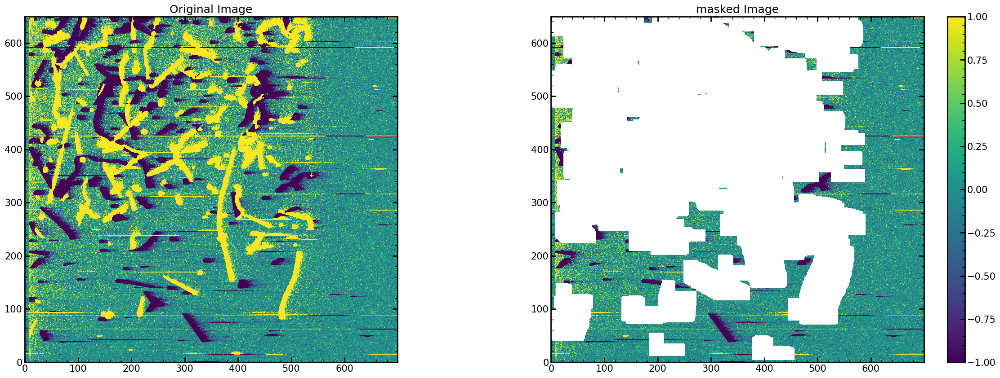

In [ ]:
fig_all, axs_all = plt.subplots(1, 2, figsize=(30, 10))		# Create figures
plt.subplot(121)
plt.title('Original Image')
plt.imshow(data[0],vmin=-1,vmax=1)

plt.subplot(122)
plt.title('masked Image')
plt.imshow(ma.masked_array(data[0], mask=event_halo_mask),vmin=-1,vmax=1)


#cax = plt.axes([0.85, 0.1, 0.075, 0.8])
plt.colorbar()#cax=cax)



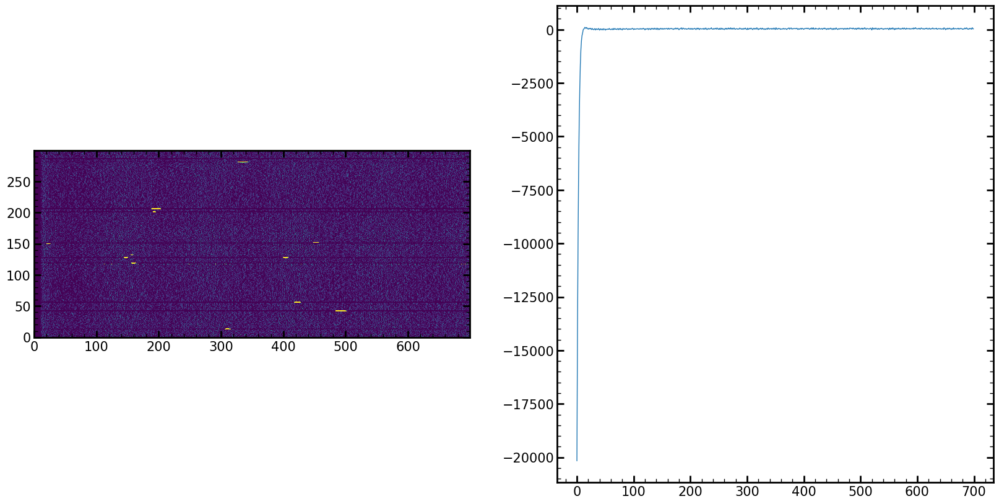

In [ ]:
with open('/home/oem/Software/cursoInstrumentacion_2022/ClasesPy/70 - ICN_LabDet/rows_81_0.npy', 'rb') as f: #Este archivo ya no esta
     rowMatrix = np.load(f)

median=np.median(rowMatrix, axis=0)
mean=np.mean(rowMatrix,axis=0)

fig, axs_all = plt.subplots(1,2, figsize=(20,10))
axs_all[0].imshow(rowMatrix, vmax=1000, vmin=0)
axs_all[1].plot(median)




plt.show()

In [ ]:
x_data=[]
i=0
for value in median:  
            x_data.append(i)
            i+=1
Xdata=np.array(x_data)*.02/86400

In [ ]:
median=median/200

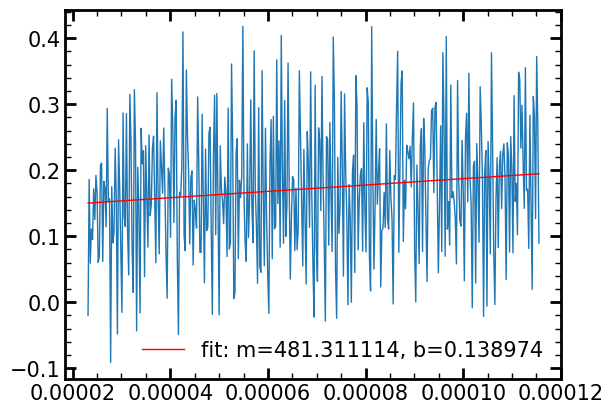

In [ ]:

plt.plot(Xdata[100:500], median[100:500])
popt, pcov = curve_fit(line, Xdata[100:500], median[100:500])
plt.plot(Xdata[100:500], line(Xdata[100:500], popt[0], popt[1]), 'r-', label='fit: m=%f, b=%f' % tuple(popt)) #plot de xdata vs f(xdata)
plt.legend()

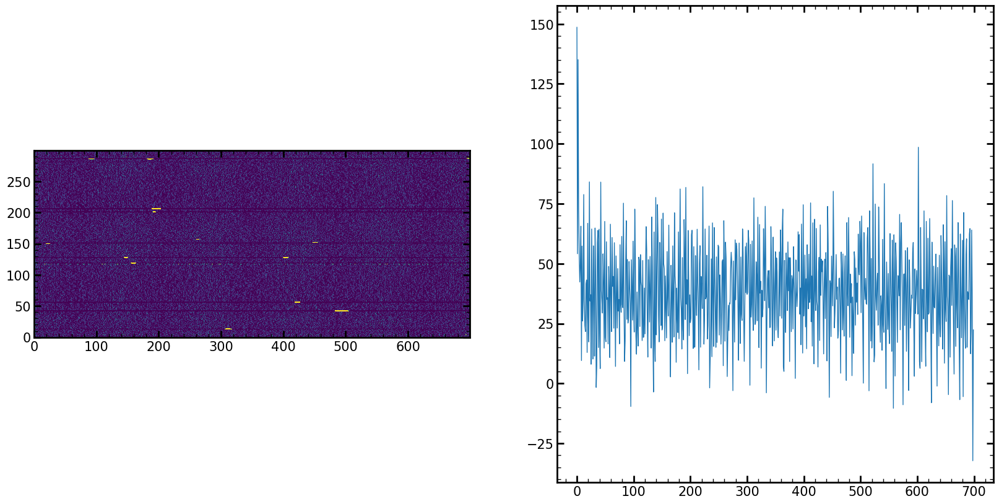

In [ ]:
with open('/home/oem/Software/cursoInstrumentacion_2022/ClasesPy/70 - ICN_LabDet/rows_81_1.npy', 'rb') as f:
     rowMatrix = np.load(f)

median=np.median(rowMatrix, axis=0)
mean=np.mean(rowMatrix,axis=0)

fig, axs_all = plt.subplots(1,2, figsize=(20,10))
axs_all[0].imshow(rowMatrix, vmax=1000, vmin=0)
axs_all[1].plot(median)

median=median/200
plt.show()

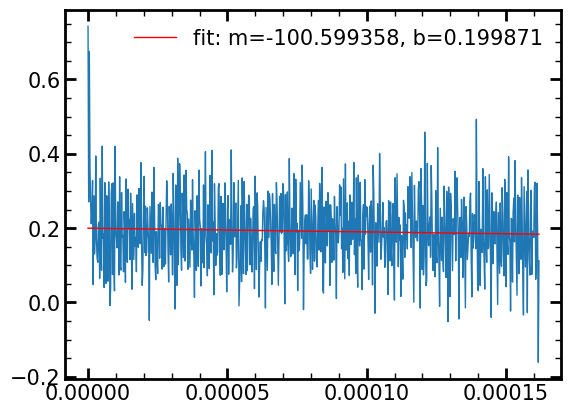

In [ ]:
plt.plot(Xdata, median)
popt, pcov = curve_fit(line, Xdata, median)
plt.plot(Xdata, line(Xdata, popt[0], popt[1]), 'r-', label='fit: m=%f, b=%f' % tuple(popt)) #plot de xdata vs f(xdata)
plt.legend()

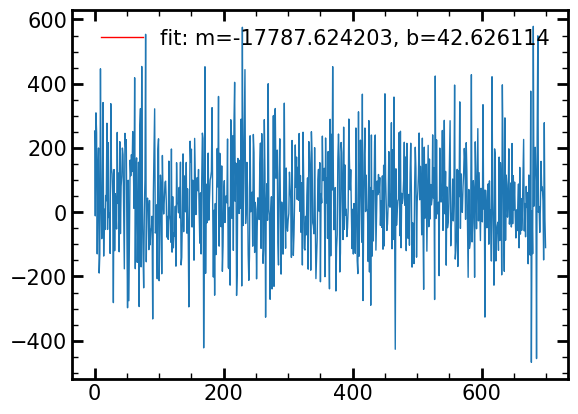

In [ ]:
plt.plot(rowMatrix[10])
popt, pcov = curve_fit(line, Xdata, rowMatrix[10])
plt.plot(Xdata, line(Xdata, popt[0], popt[1]), 'r-', label='fit: m=%f, b=%f' % tuple(popt)) #plot de xdata vs f(xdata)
plt.legend()

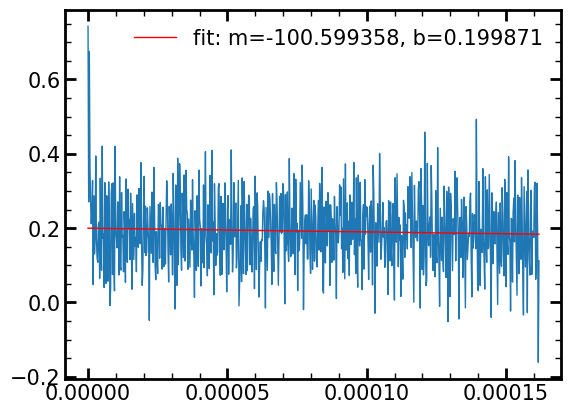

In [ ]:

#plt.plot(Xdata[100:500], median[100:500])
plt.plot(Xdata, median)
popt, pcov = curve_fit(line, Xdata, median)
plt.plot(Xdata, line(Xdata, popt[0], popt[1]), 'r-', label='fit: m=%f, b=%f' % tuple(popt)) #plot de xdata vs f(xdata)
plt.legend()

# Notas para el seminario de Alexis Feb/marzo 23

Filename: /home/oem/datosFits/07SEP2022/proc_skp_mod9_wfr13_Vvtest_vthswings2.5_sh2.5_oh-2.5_EXPOSURE7200_NSAMP4_NROW1300_NCOL1200_img_10.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     165   (1200, 1300)   float32   
  1                1 ImageHDU       164   (1200, 1300)   float32   
  2                1 ImageHDU       164   (1200, 1300)   float32   
  3                1 ImageHDU       164   (1200, 1300)   float32   
None
----------------


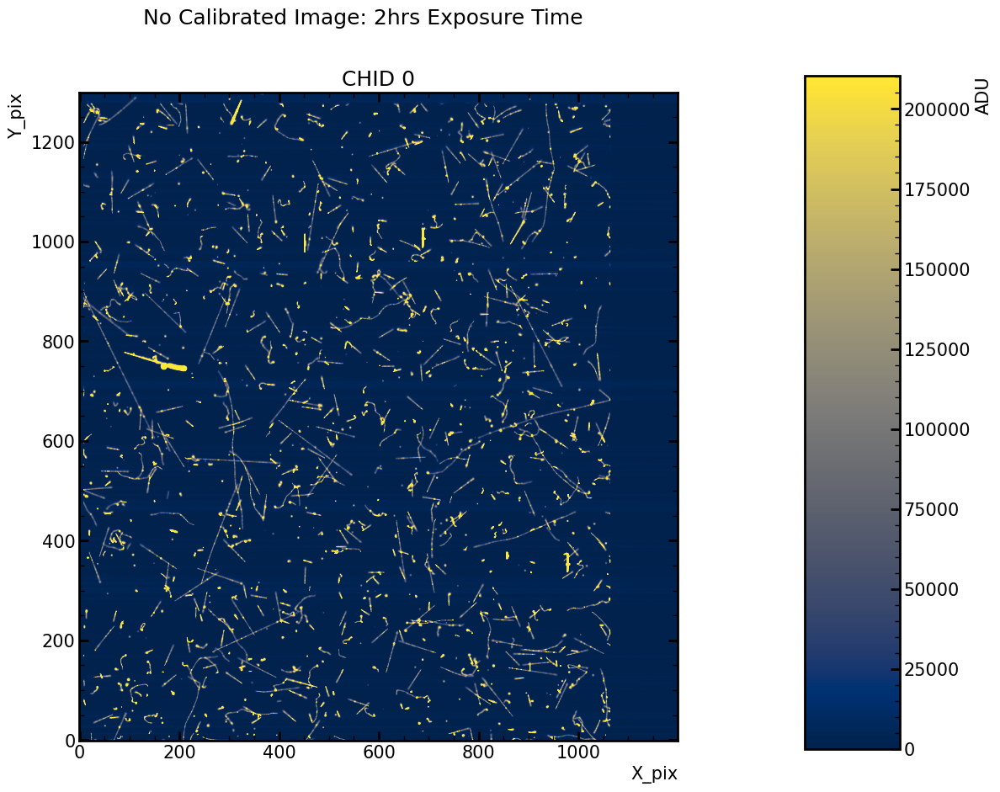

In [ ]:
path='/home/oem/datosFits/07SEP2022/proc_skp_mod9_wfr13_Vvtest_vthswings2.5_sh2.5_oh-2.5_EXPOSURE7200_NSAMP4_NROW1300_NCOL1200_img_10.fits'
hdu_list = fits.open(path)
print(hdu_list.info())
print('----------------')
# hdu_list[0].header
cmap = mpl.cm.cividis

fig=plt.figure(figsize=(15,10))
plt.subplot(1,1,1)

plt.imshow(hdu_list[0].data-np.median(hdu_list[0].data),cmap=cmap,vmin=0,vmax=210500)
plt.title('CHID '+str(0))
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
plt.suptitle('No Calibrated Image: 2hrs Exposure Time')
cax = plt.axes([0.85, 0.1, 0.075, 0.8])
plt.colorbar(cax=cax)
plt.ylabel('ADU')

plt.show()

CHID 0 Gain:(2105.78 +- 173.35)ADUs


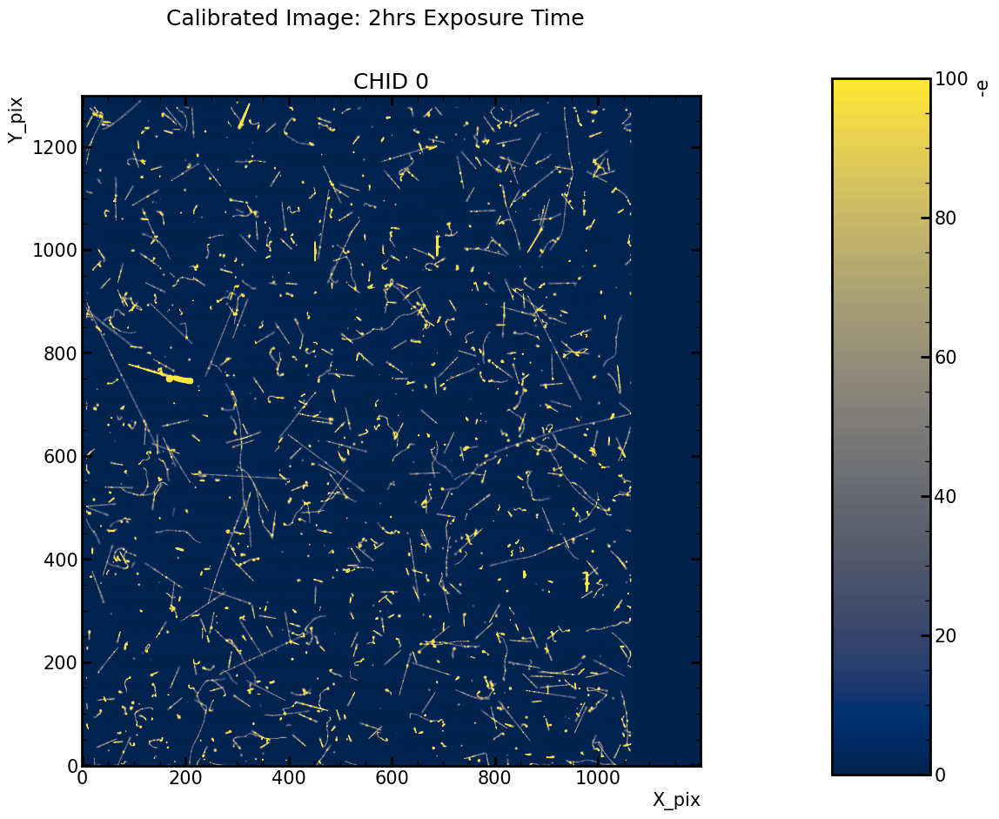

In [ ]:
data_pre = precal(hdu_list,extensions=4)
gain, gain_err, data= LocalCalib(data_pre,extensions=4)
fig=plt.figure(figsize=(15,10))
plt.subplot(1,1,1)

cmap = mpl.cm.cividis
plt.imshow(data[0],cmap=cmap,vmin=0,vmax=100)
plt.title('CHID '+str(0))
plt.ylabel('Y_pix')
plt.xlabel('X_pix')
print("CHID "+str(0)+' Gain:({:.2f} +- {:.2f})ADUs'.format(gain[0],gain_err[0]))
plt.suptitle('Calibrated Image: 2hrs Exposure Time')

cax = plt.axes([0.85, 0.1, 0.075, 0.8])
plt.colorbar(cax=cax)
plt.ylabel('-e')
#plt.savefig('IMAGES_POSCALIB.png', bbox_inches='tight', dpi=100)
    
plt.show()